<h1 align='center'> FORECASTING WITH DEEP LEARNING </h1>

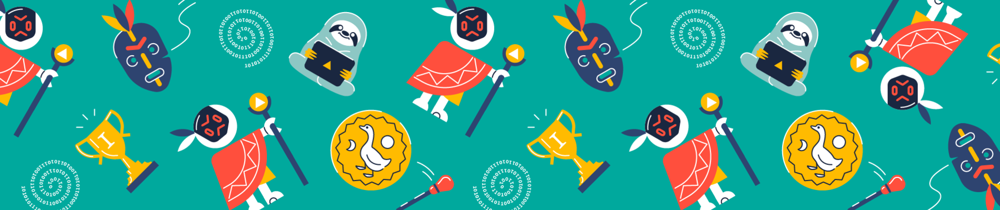

In [4]:
# Importing libraries

import csv
import pickle

import matplotlib.pyplot as plt
import matplotlib as mpl
from dataclasses import dataclass
import numpy as np
import pandas as pd
import tensorflow as tf
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from keras.layers import LSTM, SimpleRNN, GRU, Dense
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot

# Visualization setup

%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
init_notebook_mode(connected=True)

plt.style.use('seaborn-whitegrid')

font = {'family' : 'Helvetica',
        'weight' : 'bold',
        'size'   : 14}

mpl.rc('font', **font)
mpl.rcParams['figure.figsize'] = 16, 8
pd.set_option('max_columns', None)

# Seed 

from numpy.random import seed
seed(42)

## Introduction

Recurrent neural networks (RNNs) are a family of neural networks aimed at processing sequential data such as time series. The idea of parameter sharing makes it possible to extend and apply the network to examples of different lengths and generalize across them. Such sharing is particularly important when a specific piece of information can occur at multiple positions within the sequence. This allows generalization to sequence lengths that did not appear in the training set, and enables training with far fewer training samples than would be required without parameter sharing.

RNNS can be built in many different ways. Much as almost any function can be considered a feedforward neural network, essentially any function involving recurrence can be considered a recurrent neural network. However, a key concept lies with hidden states and loops that allow information to persist over time, which means the network is able to remember what it has seen before, and make adjustments to its decisions accordingly.

RNNs, despite their great potential have a few limitations where the network is not able to learn up to some epochs, and transfer information from earlier time steps to later ones, leaving perhaps behind the most important information from the beginning of the sequence during the backpropagation process. This is also referred to, as the vanishing or exploding gradient problem, where the gradients propagated over many stages tend to either vanish or explode so that we end-up loosing information that was long in the past. One way to fix this is with gated RNNs, where the network incorporates a longer-term memory such as the Long Short-Term Memory (LSTM) network or the Gated Recurrent Unit (GRU) network. 

Gated RNNs introduce changes to the architecture on how the decisions about what, how much, and when to store and release information. Information about a particular feature or category is accumulated over a long period to a hidden state until at a moment where the network decides to forget the old state by setting it to zero. This means the network is able to create paths through time that have derivatives that neither vanish or explode. The main difference with the GRU compared to the LSTM is that with the GRU a single gating unit simulaneously controls the forgetting factor and the decision to update the hidden state.

The aim will be to implement different deep learning networks, such as the RNN, the LSTM, the GRU, and variations of these, to make a forecast for one timestep ahead based on learned sequences of past sales. The sales will be forecast as averages instead of total sales which will make the sales pattern a bit easier to model leading to more accurate forecasts.

## Setup 

shape of training set: (730400, 4), shape of valid set: (182600, 4)


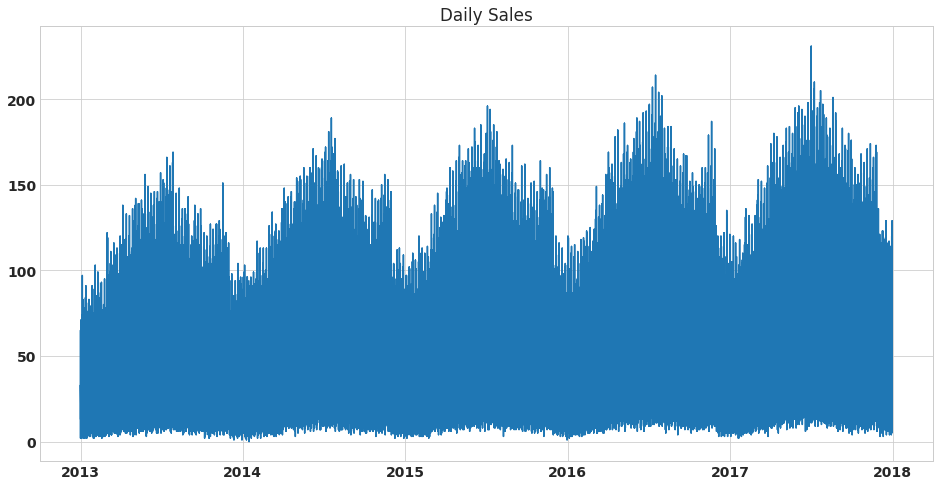

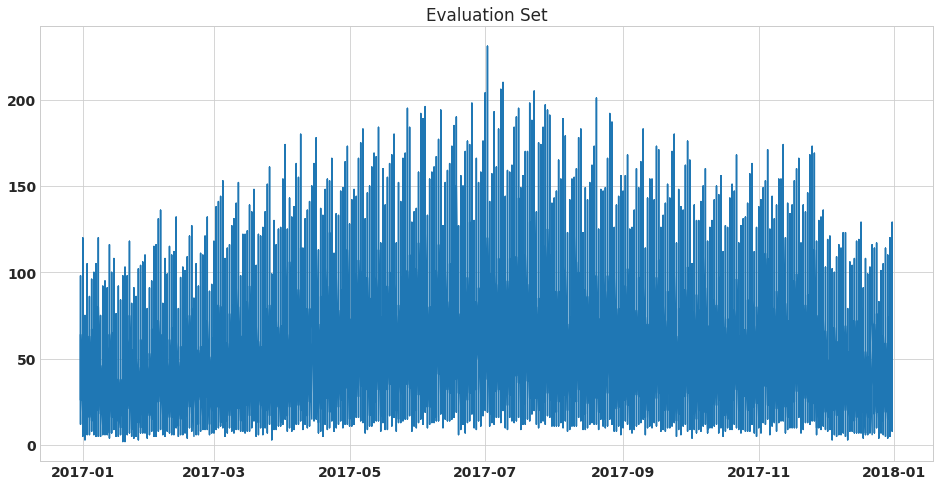

In [5]:
# Global class to hold all parameters
@dataclass
class G:
    # Forecast of average sales by store, item, and date
    TRAIN = pd.read_csv('data/demand_forecasting/train.csv', parse_dates=['date'])
    TEST = pd.read_csv('data/demand_forecasting/test.csv', parse_dates=['date'])
    SERIES = TRAIN.sort_values('date').groupby(['date','store', 'item'], as_index=False)
    SERIES = SERIES.agg({'sales':['mean']})
    SERIES.columns = ['date','store', 'item', 'sales']
    
    SPLIT_TIME = int(len(SERIES) * 0.8) # 80/20 split between training and validation
    WINDOW_SIZE = 29 # 29 days + 1 day to forecast a one month window 
    BATCH_SIZE = 360 # Size of batches
    SHUFFLE_BUFFER_SIZE = 100000 # Buffer for shuffling the data

def train_val_split(series):
    """
    Splits the dataset into training and validation sets.
    
    Args:
     series (array of int) - dataset for training and validating
    """
    
    series_train = series[:G.SPLIT_TIME]
    time_train = series_train['date']
    
    series_valid = series[G.SPLIT_TIME:]
    time_valid = series_valid['date']

    return time_train, series_train, time_valid, series_valid


# Split the data to training and validation sets 
time_train, series_train, time_valid, series_valid = train_val_split(G.SERIES)
print("shape of training set: {}, shape of valid set: {}".format(series_train.shape, series_valid.shape))    

def plot_series(x, y, format="-", start=0, end=None,
                title=None, xlabel=None, ylabel=None, legend=None ):
    """
    Visualizes time series data.

    Args:
      x (array of int) - contains values for the x-axis
      y (array of int or tuple of arrays) - contains the values for the y-axis
      format (string) - line style when plotting the graph
      start (int) - first time step to plot
      end (int) - last time step to plot
      title (string) - title of the plot
      xlabel (string) - label for the x-axis
      ylabel (string) - label for the y-axis
      legend (list of strings) - legend for the plot
    """
    
    plt.figure(figsize=(16, 8))
    
    if type(y) is tuple:
      for y_curr in y:

        plt.plot(x[start:end], y_curr[start:end], format)

    else:
      
      plt.plot(x[start:end], y[start:end], format)

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)

    if legend:
      plt.legend(legend)

    plt.title(title)
    plt.grid(True)

    plt.show()

# Plot the whole series and the validation period
plot_series(G.SERIES['date'], G.SERIES['sales'], title='Daily Sales')
plot_series(time_valid, series_valid['sales'], title='Evaluation Set')

In [3]:
# Variables

G.SERIES.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 913000 entries, 0 to 912999
Data columns (total 4 columns):
 #   Column  Non-Null Count   Dtype         
---  ------  --------------   -----         
 0   date    913000 non-null  datetime64[ns]
 1   store   913000 non-null  int64         
 2   item    913000 non-null  int64         
 3   sales   913000 non-null  int64         
dtypes: datetime64[ns](1), int64(3)
memory usage: 34.8 MB


In [4]:
# Null values

G.SERIES.isna().sum()

date     0
store    0
item     0
sales    0
dtype: int64

In [5]:
# Statistics of the variables

G.SERIES.describe()

,store,item,sales
count,913000.000000,913000.000000,913000.000000
mean,5.500000,25.500000,52.250287
std,2.872283,14.430878,28.801144
min,1.000000,1.000000,0.000000
25%,3.000000,13.000000,30.000000
50%,5.500000,25.500000,47.000000
75%,8.000000,38.000000,70.000000
max,10.000000,50.000000,231.000000


In [7]:
# Timespan for training data

print('Min date from train set: %s' % series_train['date'].min().date())
print('Max date from train set: %s' % series_train['date'].max().date())

Min date from train set: 2013-01-01
Max date from train set: 2016-12-31


In [10]:
# Timespan for validation data

print('Min date from test set: %s' % series_valid['date'].min().date())
print('Max date from test set: %s' % series_valid['date'].max().date())

Min date from test set: 2016-12-31
Max date from test set: 2017-12-31


In [12]:
# Numer of stores

print('Unique stores in dataset: {}'.format(series_train['store'].nunique()))

Unique stores in dataset: 10


In [13]:
# Numer of items

print('Unique items in dataset: {}'.format(series_train['item'].nunique()))

Unique items in dataset: 50


## Explorative Data Analysis

We will first explore the target variable by plotting the daily sales, the daily store sales, and the daily item sales. Afterwards, we will perform time series analysis by focusing on each store separately.

In [126]:
# Plotting daily sales with Plotly

daily_sales = G.SERIES.groupby('date', as_index=False)['sales'].sum()

daily_sales_sc = go.Scatter(x=daily_sales['date'], y=daily_sales['sales'])
layout = go.Layout(title='Daily sales', xaxis=dict(title='Date'), yaxis=dict(title='Sales'))
fig = go.Figure(data=[daily_sales_sc], layout=layout)
iplot(fig)

In [127]:
# Daily Store Sales with Plotly

store_daily_sales = G.SERIES.groupby(['store', 'date'], as_index=False)['sales'].sum()

store_daily_sales_sc = []
for store in store_daily_sales['store'].unique():
    current_store_daily_sales = store_daily_sales[(store_daily_sales['store'] == store)]
    store_daily_sales_sc.append(go.Scatter(x=current_store_daily_sales['date'], y=current_store_daily_sales['sales'], name=('Store %s' % store)))

layout = go.Layout(title='Daily Store Sales', xaxis=dict(title='Date'), yaxis=dict(title='Sales'))
fig = go.Figure(data=store_daily_sales_sc, layout=layout)
iplot(fig)

In [128]:
# Plotting daily item sales with Plotly

item_daily_sales = G.SERIES.groupby(['item', 'date'], as_index=False)['sales'].sum()

item_daily_sales_sc = []
for item in item_daily_sales['item'].unique():
    current_item_daily_sales = item_daily_sales[(item_daily_sales['item'] == item)]
    item_daily_sales_sc.append(go.Scatter(x=current_item_daily_sales['date'], y=current_item_daily_sales['sales'], name=('Item %s' % item)))

layout = go.Layout(title='Daily Item Sales', xaxis=dict(title='Date'), yaxis=dict(title='Sales'))
fig = go.Figure(data=item_daily_sales_sc, layout=layout)
iplot(fig)

## Time Series Analysis 

We could already see a trend and some seasonal fluctuations in the series so we will analyze the series now more closely by decomposing the monthly sales from all the stores to see how the different components of the series - trend, seasonal fluctuations and residual - compare, and then follow-up by seeing how the series is autocorrelated and whether the series is stationary or not.

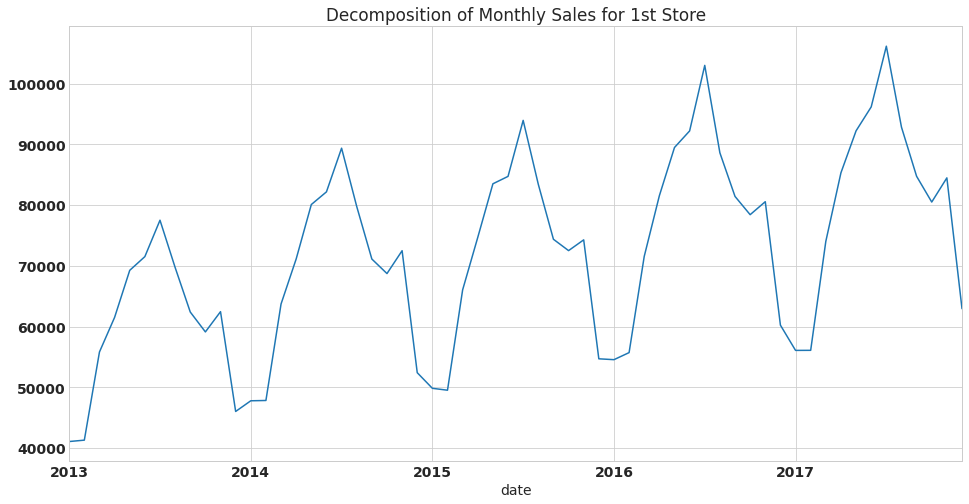

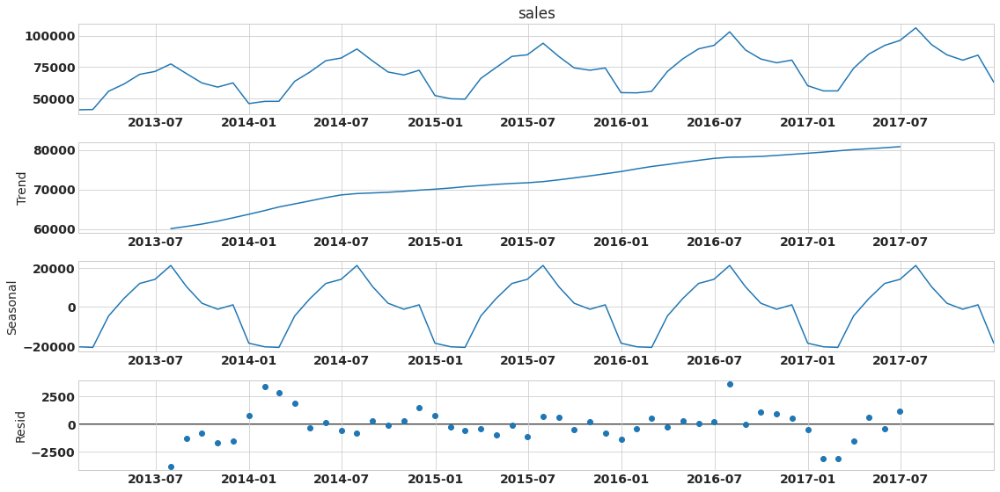

In [6]:
# Sales decomposition for 1st store

daily_sales_store_1 = G.SERIES[G.SERIES['store'] == 1].groupby('date', as_index=True)['sales'].sum()
monthly_sales_store_1 = daily_sales_store_1.resample('M').sum()
fig = monthly_sales_store_1.plot(kind='line', ax=plt.subplot(1,1,1))
plt.title('Decomposition of Monthly Sales for 1st Store')
fig = sm.tsa.seasonal_decompose(monthly_sales_store_1, model='additive', period=12).plot()
plt.show()

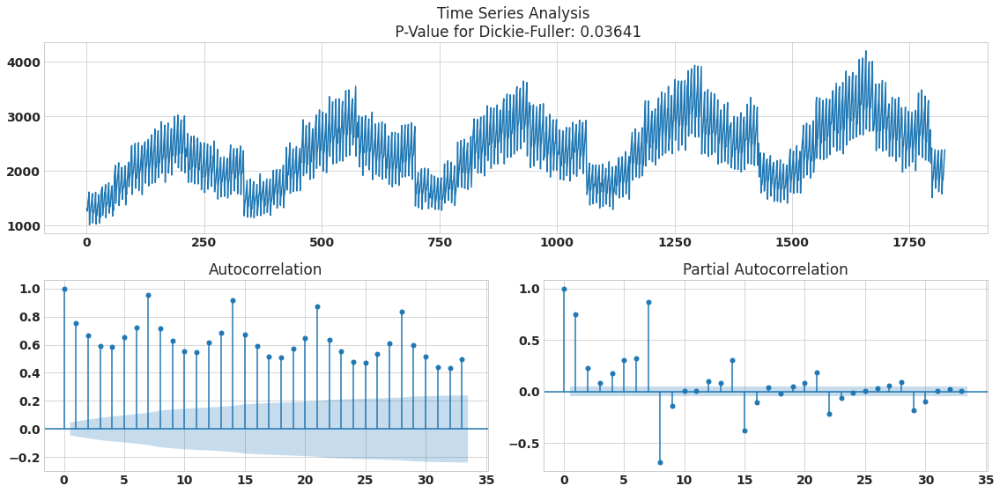

In [7]:
# Time series analysis for 1st store

def tsplot(series, lags=None):
    """
    Plots time series, ACF, PACF, and performs Augmented Dickey–Fuller test.
    
    Args:
     series (data set) - data for time series analysis
     lags (int) - optional lags for autocorrelation calculations
    """
    if not isinstance(series, pd.Series):
        series = pd.Series(series)
           
    fig = plt.figure()
    layout = (2, 2)
    ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
    acf_ax = plt.subplot2grid(layout, (1, 0))
    pacf_ax = plt.subplot2grid(layout, (1, 1))

    series.plot(ax=ts_ax)
    p_value = sm.tsa.stattools.adfuller(series)[1]
    ts_ax.set_title('Time Series Analysis \n P-Value for Dickie-Fuller: {0:.5f}'.format(p_value))
    plot_acf(series, lags=lags, ax=acf_ax)
    plot_pacf(series, lags=lags, ax=pacf_ax)
    plt.tight_layout()


tsplot(daily_sales_store_1.values)

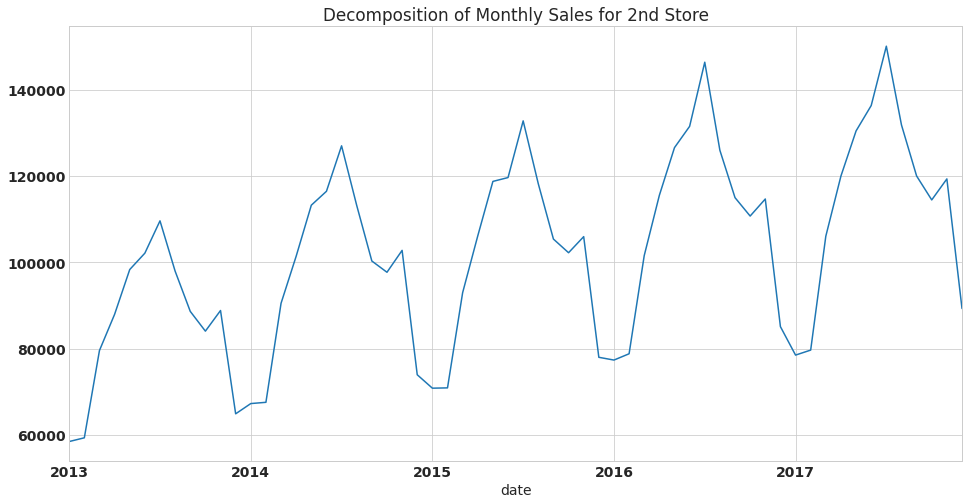

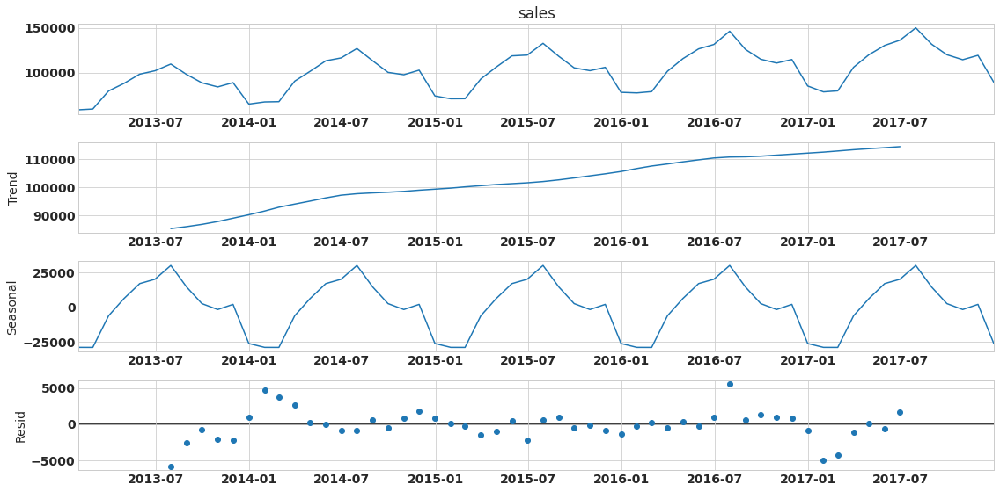

In [9]:
# Sales decomposition for 2nd store

daily_sales_store_2 = G.SERIES[G.SERIES['store'] == 2].groupby('date', as_index=True)['sales'].sum()
monthly_sales_store_2 = daily_sales_store_2.resample('M').sum()
fig = monthly_sales_store_2.plot(kind='line', ax=plt.subplot(1,1,1))
plt.title('Decomposition of Monthly Sales for 2nd Store')
fig = sm.tsa.seasonal_decompose(monthly_sales_store_2, model='additive', period=12).plot()
plt.show()

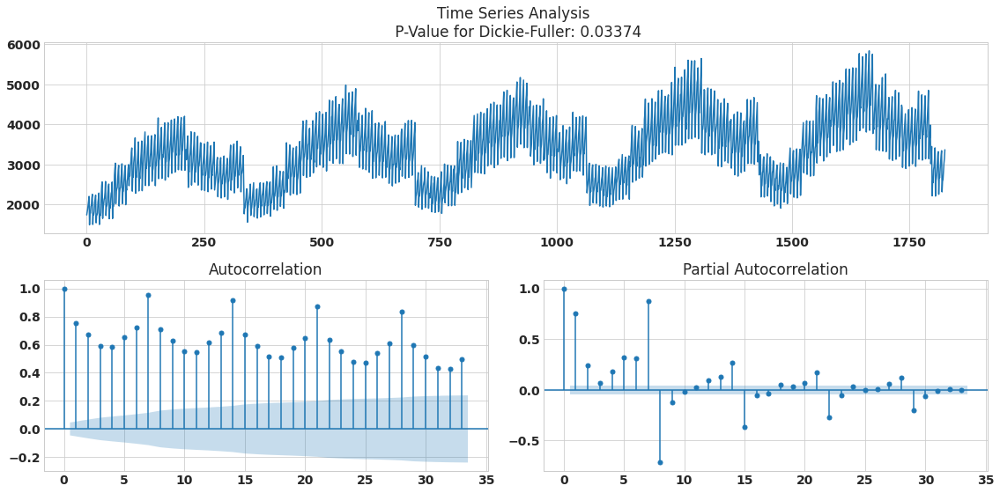

In [170]:
# time series analysis for 2nd store

tsplot(daily_sales_store_2.values)

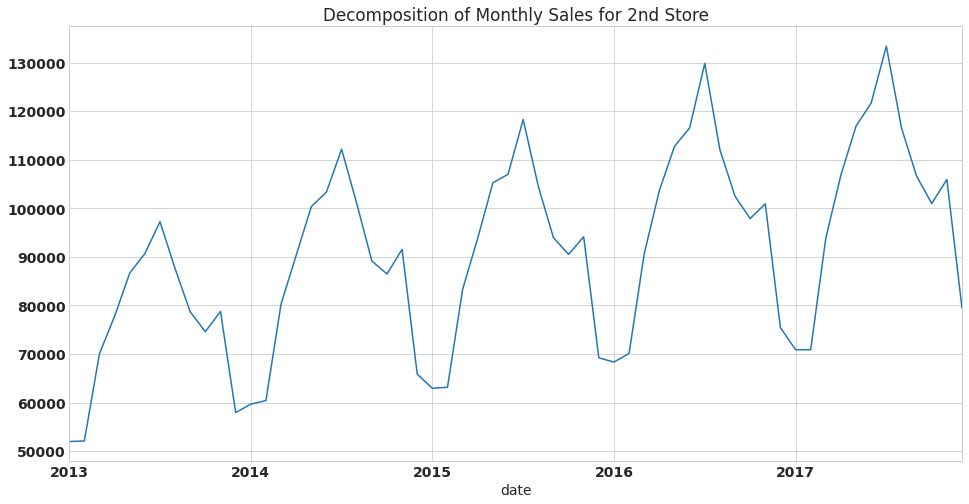

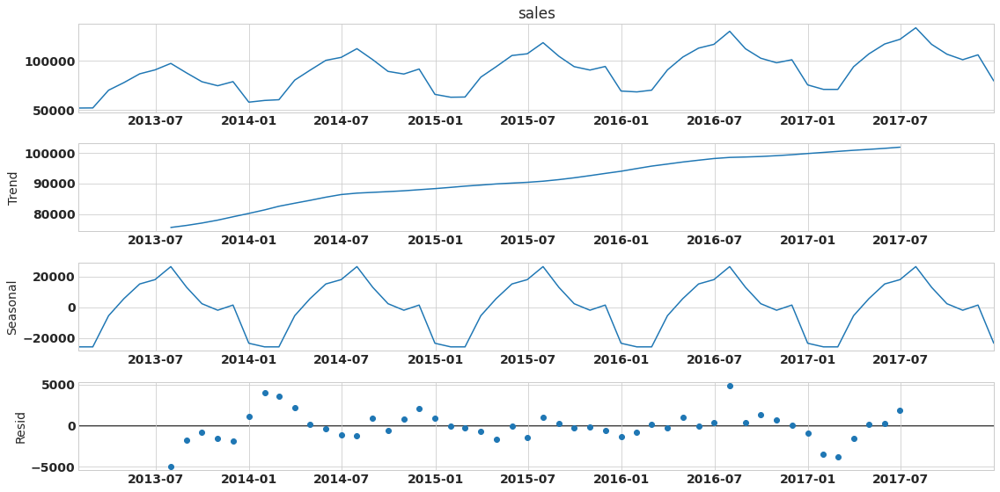

In [10]:
# Sales decomposition for 3rd store

daily_sales_store_3 = G.SERIES[G.SERIES['store'] == 3].groupby('date', as_index=True)['sales'].sum()
monthly_sales_store_3 = daily_sales_store_3.resample('M').sum()
fig = monthly_sales_store_3.plot(kind='line', ax=plt.subplot(1,1,1))
plt.title('Decomposition of Monthly Sales for 2nd Store')
fig = sm.tsa.seasonal_decompose(monthly_sales_store_3, model='additive', period=12).plot()
plt.show()

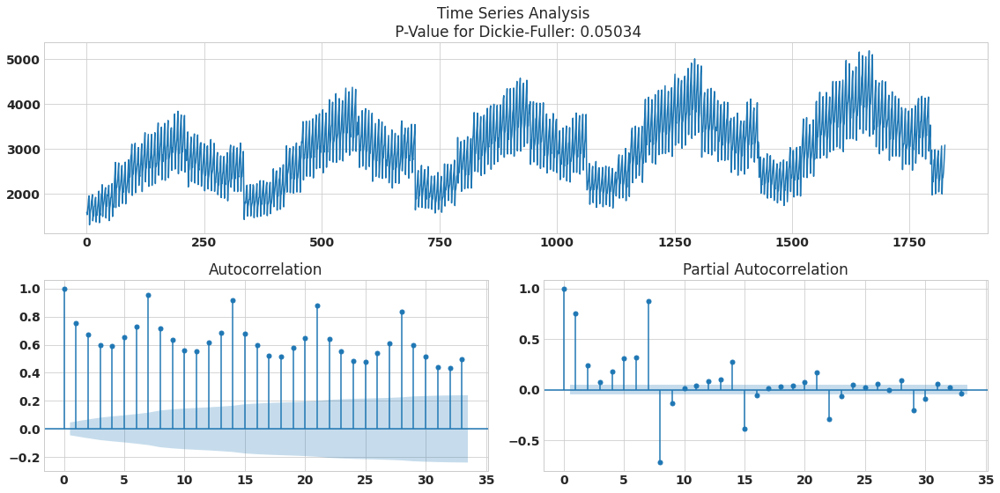

In [178]:
# time series analysis for 3rd store

tsplot(daily_sales_store_3.values)

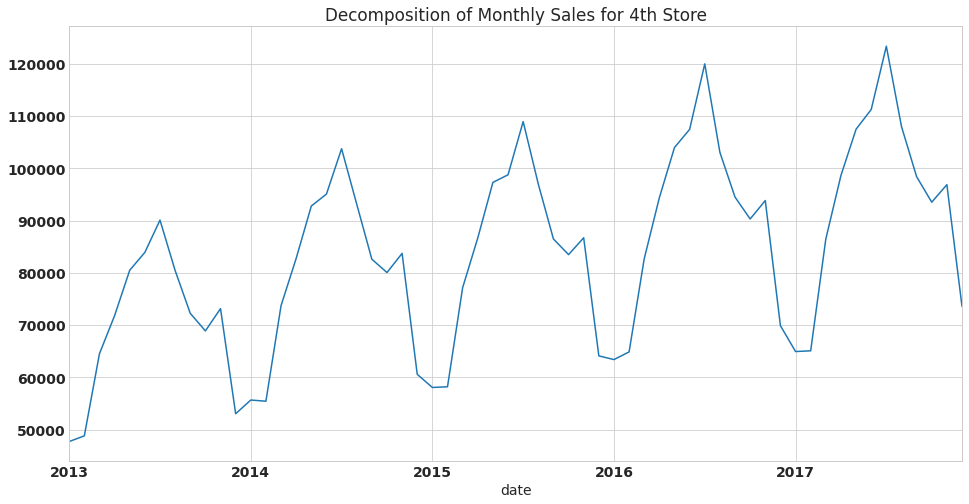

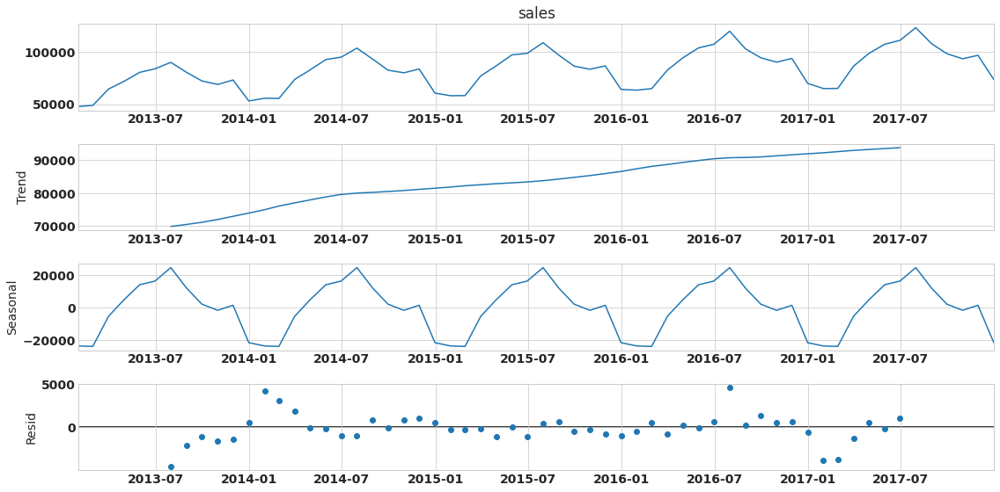

In [11]:
# Sales decomposition for 4th store

daily_sales_store_4 = G.SERIES[G.SERIES['store'] == 4].groupby('date', as_index=True)['sales'].sum()
monthly_sales_store_4 = daily_sales_store_4.resample('M').sum()
fig = monthly_sales_store_4.plot(kind='line', ax=plt.subplot(1,1,1))
plt.title('Decomposition of Monthly Sales for 4th Store')
fig = sm.tsa.seasonal_decompose(monthly_sales_store_4, model='additive', period=12).plot()
plt.show()

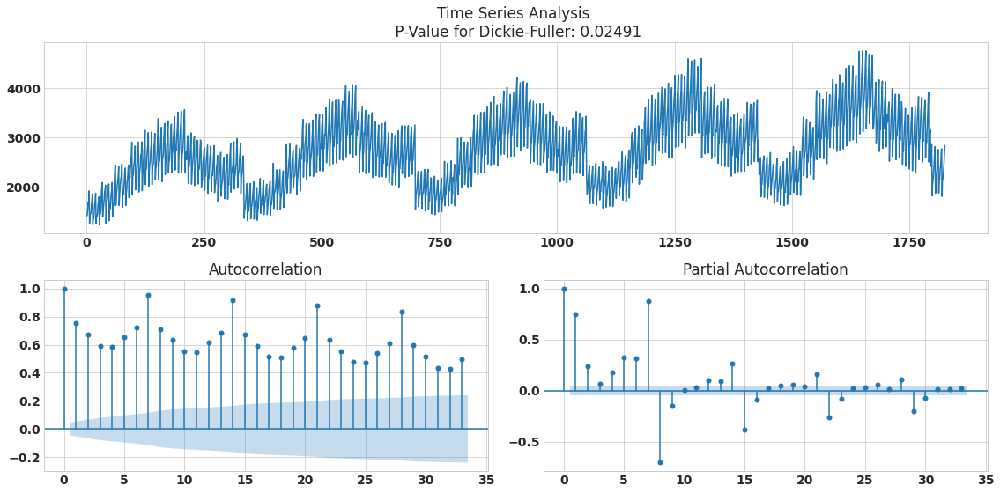

In [179]:
# time series analysis for 4th store

tsplot(daily_sales_store_4.values)

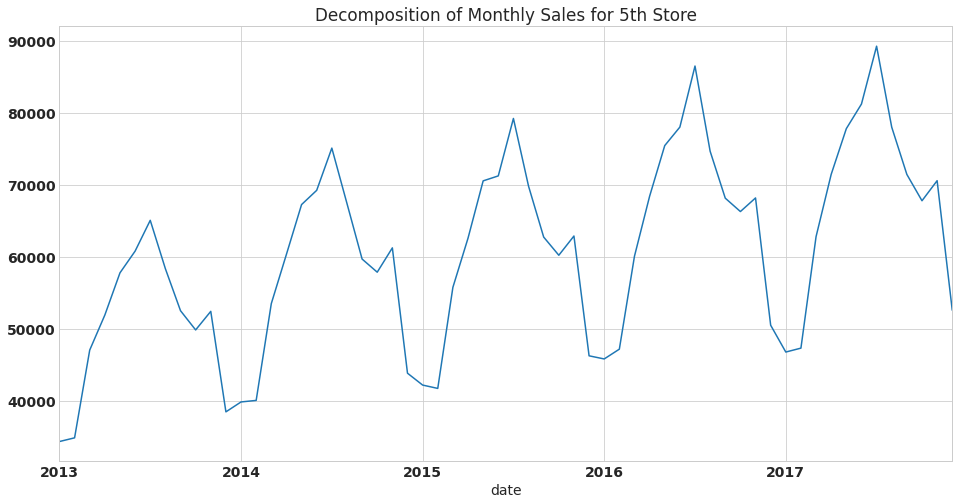

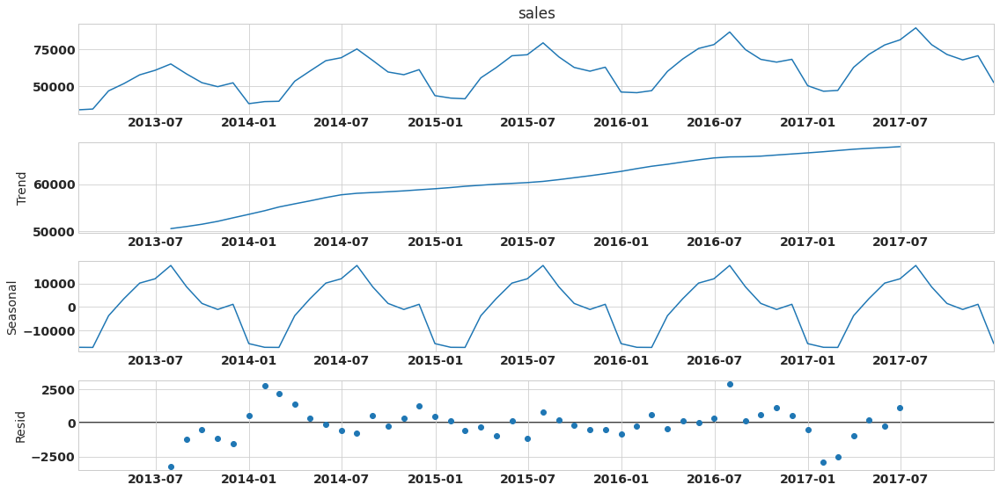

In [12]:
# Sales decomposition for 5th store

daily_sales_store_5 = G.SERIES[G.SERIES['store'] == 5].groupby('date', as_index=True)['sales'].sum()
monthly_sales_store_5 = daily_sales_store_5.resample('M').sum()
fig = monthly_sales_store_5.plot(kind='line', ax=plt.subplot(1,1,1))
plt.title('Decomposition of Monthly Sales for 5th Store')
fig = sm.tsa.seasonal_decompose(monthly_sales_store_5, model='additive', period=12).plot()
plt.show()

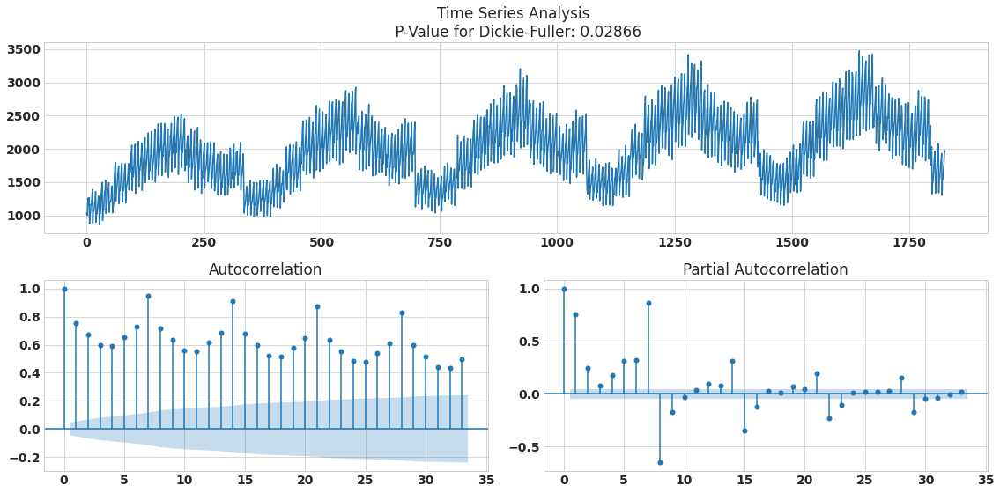

In [181]:
# time series analysis for 5th store

tsplot(daily_sales_store_5.values)

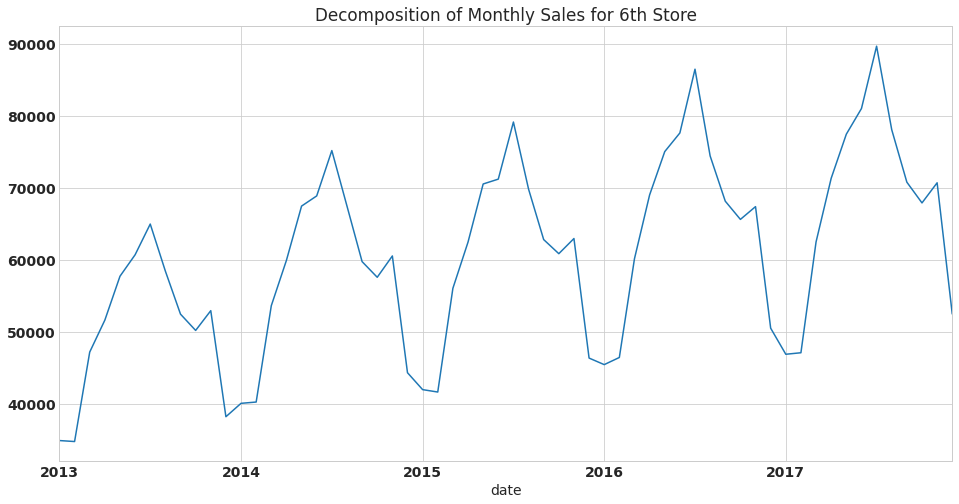

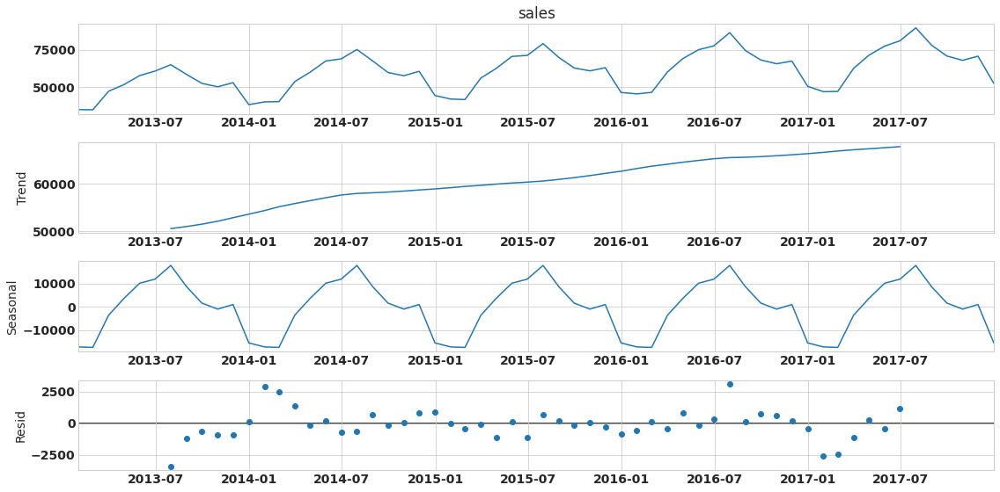

In [13]:
# Sales decomposition for 6th store

daily_sales_store_6 = G.SERIES[G.SERIES['store'] == 6].groupby('date', as_index=True)['sales'].sum()
monthly_sales_store_6 = daily_sales_store_6.resample('M').sum()
fig = monthly_sales_store_6.plot(kind='line', ax=plt.subplot(1,1,1))
plt.title('Decomposition of Monthly Sales for 6th Store')
fig = sm.tsa.seasonal_decompose(monthly_sales_store_6, model='additive', period=12).plot()
plt.show()

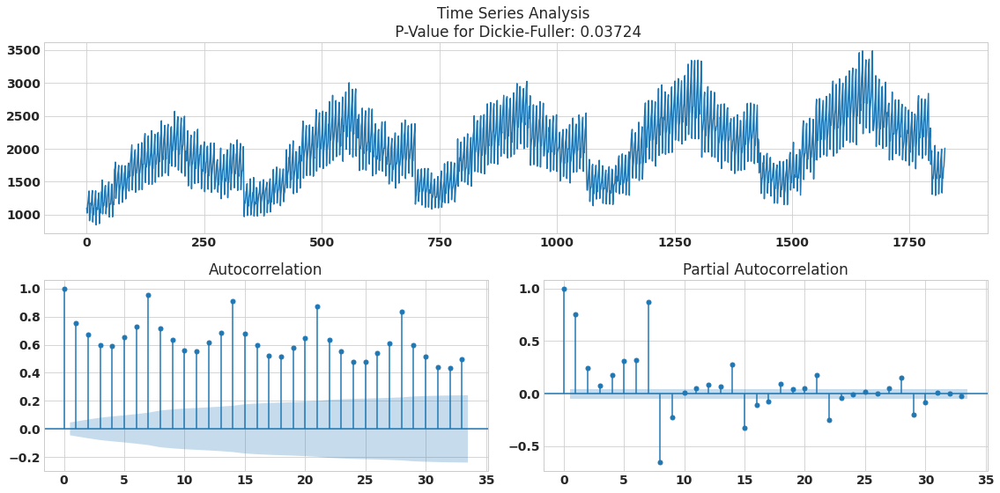

In [183]:
# time series analysis for 6th store

tsplot(daily_sales_store_6.values)

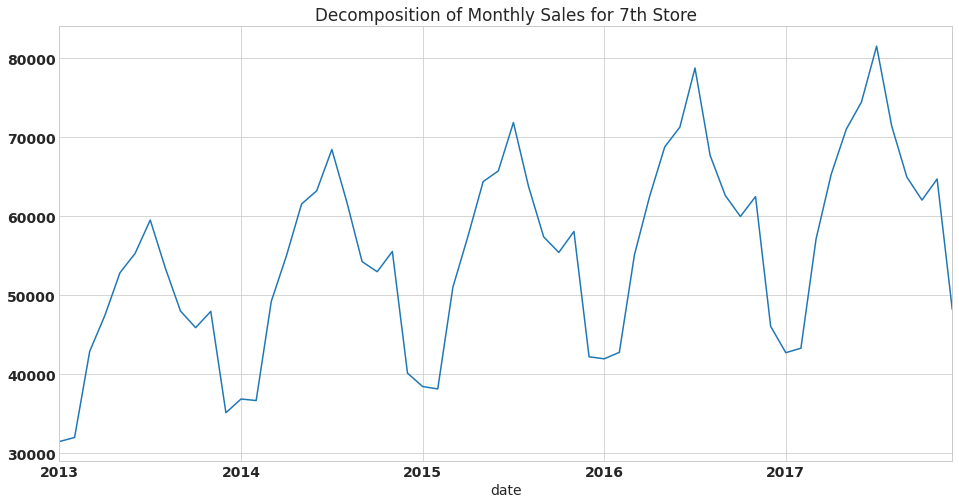

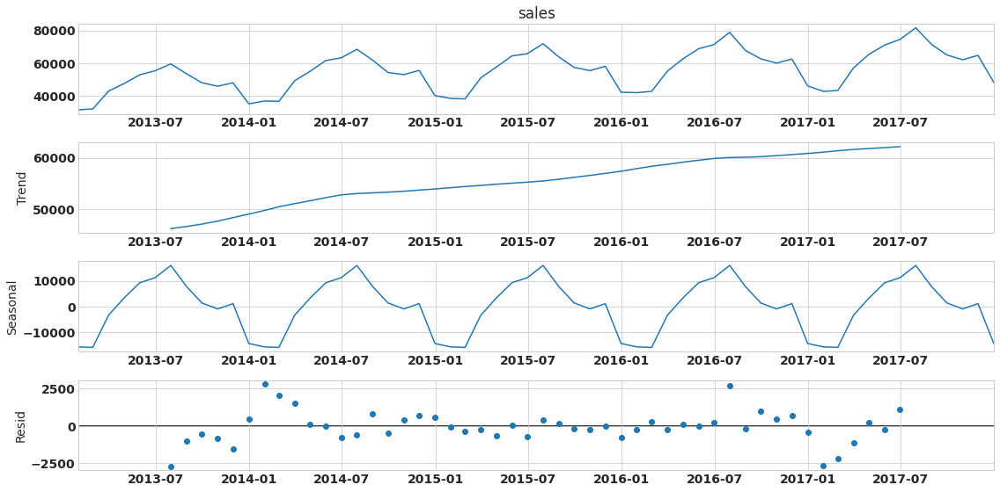

In [14]:
# Sales decomposition for 7th store

daily_sales_store_7 = G.SERIES[G.SERIES['store'] == 7].groupby('date', as_index=True)['sales'].sum()
monthly_sales_store_7 = daily_sales_store_7.resample('M').sum()
fig = monthly_sales_store_7.plot(kind='line', ax=plt.subplot(1,1,1))
plt.title('Decomposition of Monthly Sales for 7th Store')
fig = sm.tsa.seasonal_decompose(monthly_sales_store_7, model='additive', period=12).plot()
plt.show()

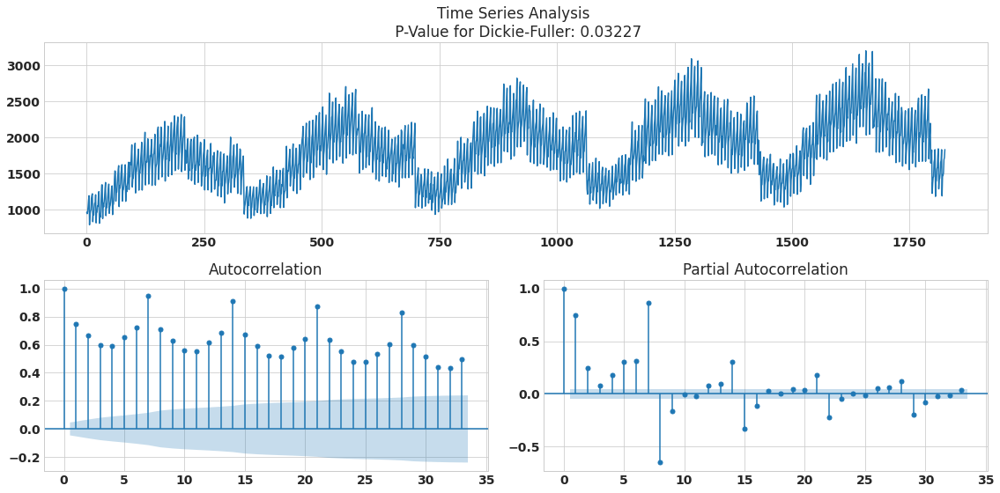

In [184]:
# time series analysis for 7th store

tsplot(daily_sales_store_7.values)

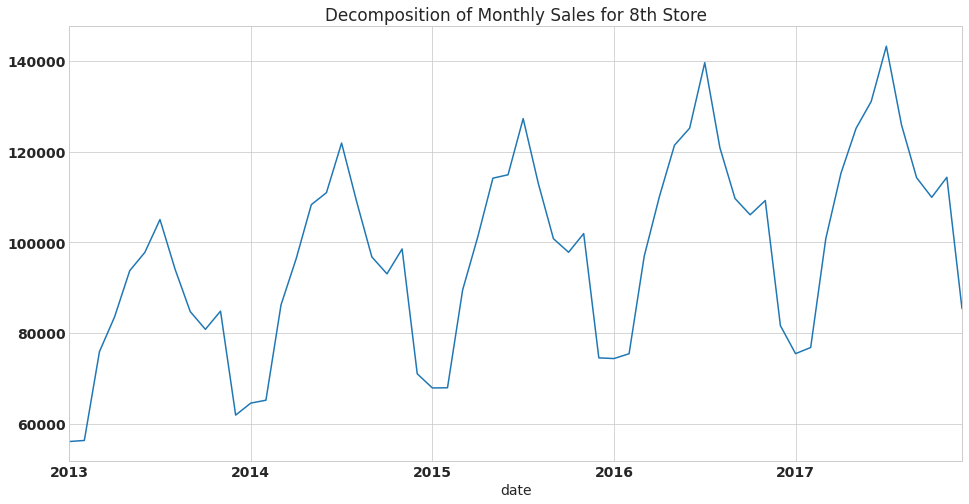

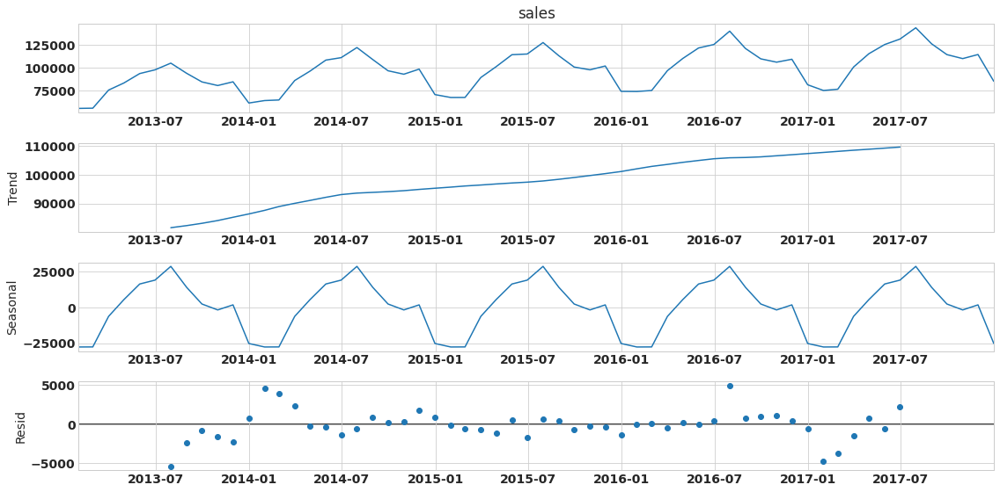

In [15]:
# Sales decomposition for 8th store

daily_sales_store_8 = G.SERIES[G.SERIES['store'] == 8].groupby('date', as_index=True)['sales'].sum()
monthly_sales_store_8 = daily_sales_store_8.resample('M').sum()
fig = monthly_sales_store_8.plot(kind='line', ax=plt.subplot(1,1,1))
plt.title('Decomposition of Monthly Sales for 8th Store')
fig = sm.tsa.seasonal_decompose(monthly_sales_store_8, model='additive', period=12).plot()
plt.show()

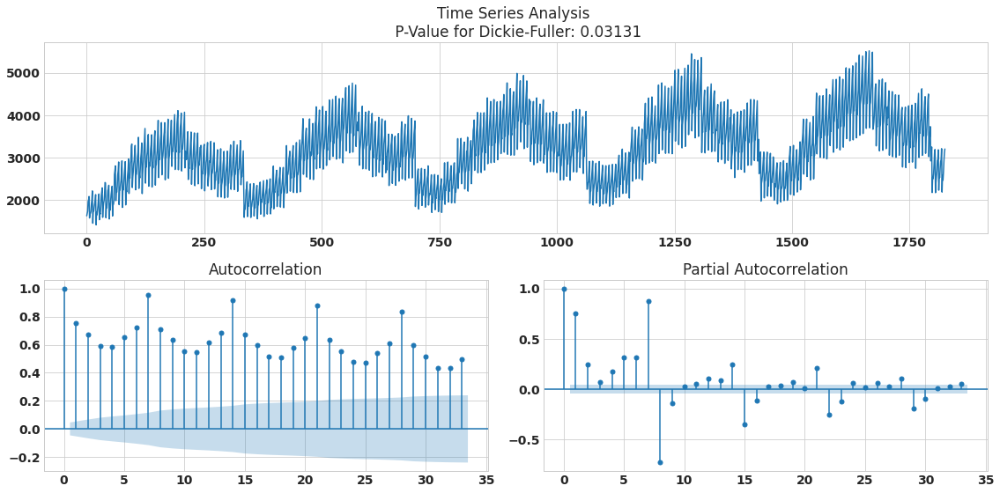

In [185]:
# time series analysis for 8th store

tsplot(daily_sales_store_8.values)

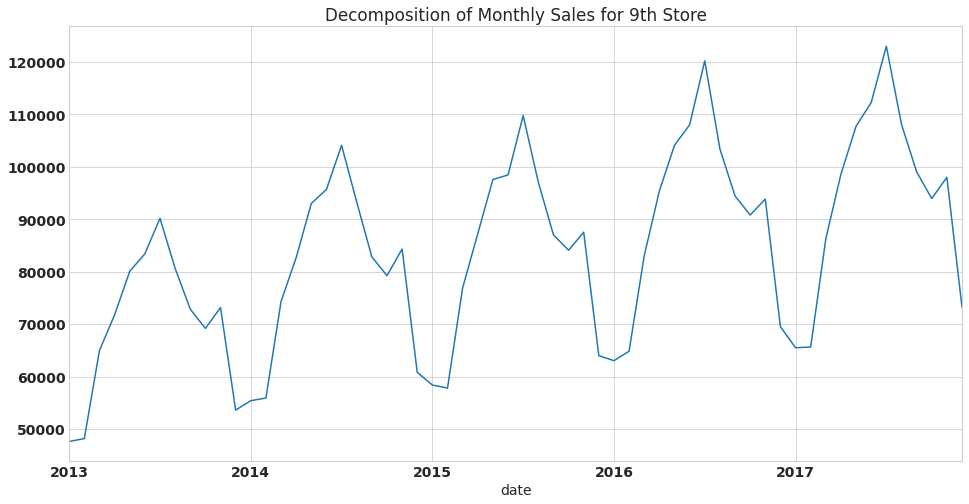

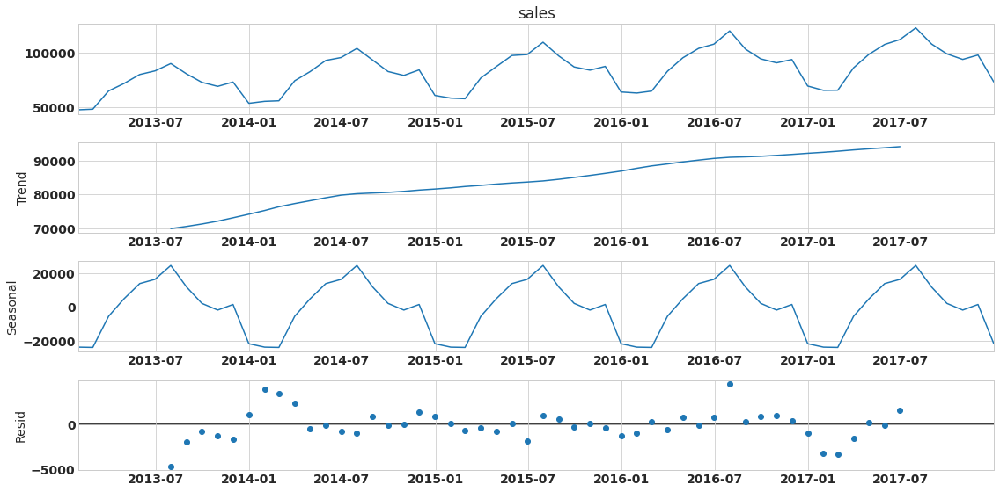

In [16]:
# Sales decomposition for 9th store

daily_sales_store_9 = G.SERIES[G.SERIES['store'] == 9].groupby('date', as_index=True)['sales'].sum()
monthly_sales_store_9 = daily_sales_store_9.resample('M').sum()
fig = monthly_sales_store_9.plot(kind='line', ax=plt.subplot(1,1,1))
plt.title('Decomposition of Monthly Sales for 9th Store')
fig = sm.tsa.seasonal_decompose(monthly_sales_store_9, model='additive', period=12).plot()
plt.show()

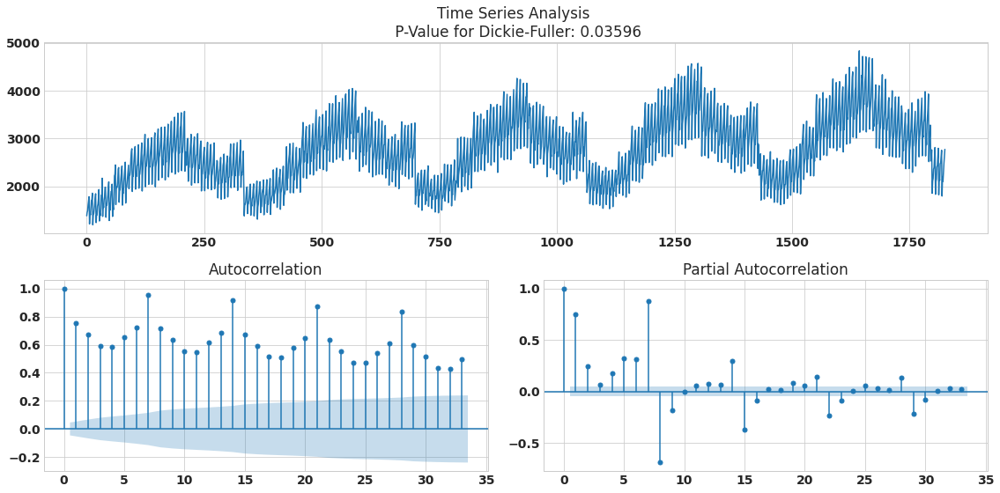

In [186]:
# time series analysis for 9th store

tsplot(daily_sales_store_9.values)

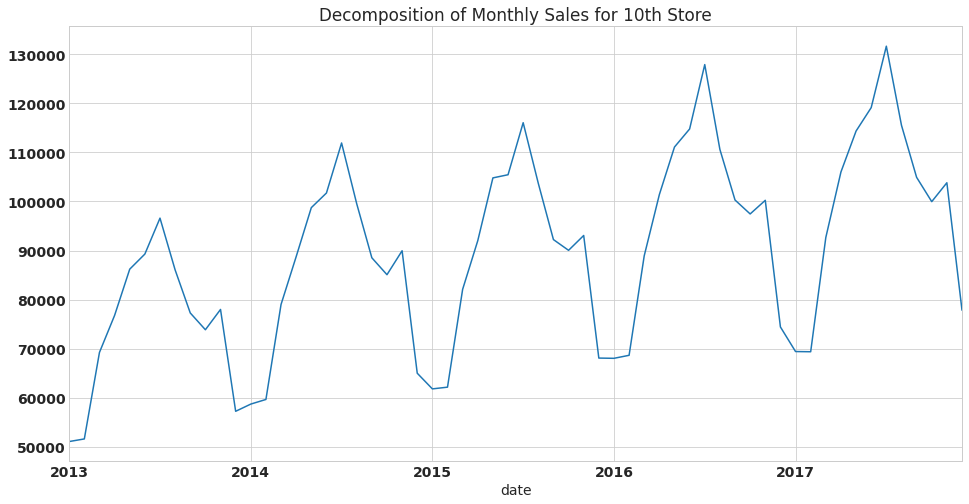

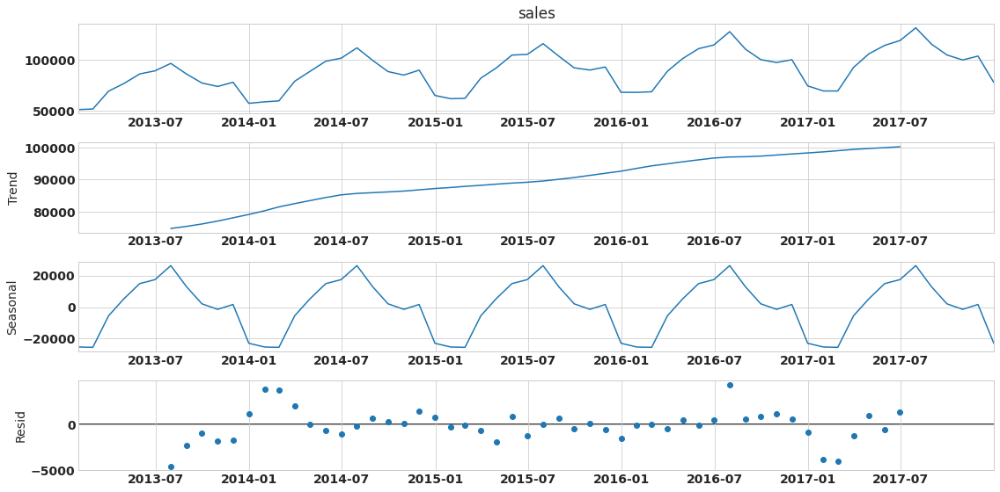

In [19]:
# Sales decomposition for 10th store

daily_sales_store_10 = G.SERIES[G.SERIES['store'] == 10].groupby('date', as_index=True)['sales'].sum()
monthly_sales_store_10 = daily_sales_store_10.resample('M').sum()
fig = monthly_sales_store_10.plot(kind='line', ax=plt.subplot(1,1,1))
plt.title('Decomposition of Monthly Sales for 10th Store')
fig = sm.tsa.seasonal_decompose(monthly_sales_store_10, model='additive', period=12).plot()
plt.show()

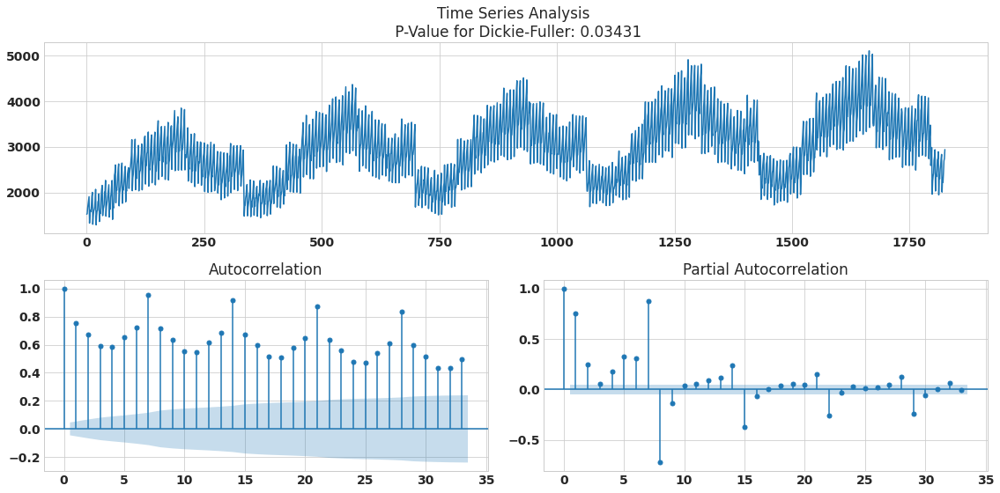

In [187]:
# time series analysis for 10th store

tsplot(daily_sales_store_10.values)

<b> Analyzing the results </b>

All the stores share a similar deterministic seasonal and trend components in the sales. The Dicky-Fuller test confirms that all the stores sales are stationary and can be modeled for forecasting.

For all the stores, the Autocorrelation Function (ACF) shows strong correlation all the way to lag 28 where the last spike over 0.8 correlation occurs. The Partial Autocorrelation Function (PACF) which is another important function that, instead of finding correlations of present values with lags like the ACF, finds correlation of the residuals with the next lag. With the PACF we can see that there is a strong positive correlation with lag 7 (the same day of the next week) and a negative correlation with the following lag 8 where the correlation cuts off. 

As we can notice a strong correlation for the sequence of the 29 first days, and as we want to have a long sequence as we are making a forecast that has a long time horizon, we will use this as the number of days that will be used as a window to make the forecast.

# Modeling

Deep neural networks are capable of learning and extracting features from the data so there is no need to create additional features. However, the learning process can be adjusted by choosing the type of model together with the parameters for the model. For the model to learn from the data, the dataset needs to be transformed into sequences so that the neural network can eventually make a forecast.

Part of the available data will be used for training different models, and the remainder to evaluate the models.  The split will be 80/20 and a separate part is kept for testing, but as there are not sales figures on the test data set, the test set will not be used, as the forecast will be done from the lagged values of the realized sales.

Finally, the loss function to train and evaluate the models will be the Huber loss and the evaluation will be performed with MAE and MSE.

In [22]:
def windowed_dataset(series, window_size=G.WINDOW_SIZE, batch_size=G.BATCH_SIZE, shuffle_buffer=G.SHUFFLE_BUFFER_SIZE):
    """
    Sequences take the form of a window, where the past timestep values
    are the features that are used to predict one timestep ahead the target
    label. Output comes as windows that are shuffled and made into batches.
    
    Args:
     series (array of int) - dataset for training and validating
     window_size (int) - size of the horizon window to make forecast
     batch_size (int) - size of batches
     shuffle_buffer (int) - size of buffer for shuffling
    
    """
    # Setup the dataset
    ds = tf.data.Dataset.from_tensor_slices(series)
    # Window the data but only take those with the specified size
    ds = ds.window(window_size + 1, shift=1, drop_remainder=True)
    # Flatten the windows by putting its elements in a single batch
    ds = ds.flat_map(lambda w: w.batch(window_size + 1))
    # Shuffle the windows
    ds = ds.shuffle(shuffle_buffer)
    # Create tuples with features and labels 
    ds = ds.map(lambda w: (w[:-1], w[-1]))
    # Create batches of windows
    ds = ds.batch(batch_size).prefetch(1)
    return ds

train_set = windowed_dataset(series_train['sales'], window_size=G.WINDOW_SIZE, batch_size=G.BATCH_SIZE, shuffle_buffer=G.SHUFFLE_BUFFER_SIZE)
val_set = windowed_dataset(series_valid['sales'], window_size=G.WINDOW_SIZE, batch_size=G.BATCH_SIZE, shuffle_buffer=G.SHUFFLE_BUFFER_SIZE)

In [21]:
# Print properties of a single batch

for windows in train_set.take(1):
  print(f'data type: {type(windows)}')
  print(f'number of elements in the tuple: {len(windows)}')
  print(f'shape of first element: {windows[0].shape}')
  print(f'shape of second element: {windows[1].shape}')

data type: <class 'tuple'>
number of elements in the tuple: 2
shape of first element: (360, 29)
shape of second element: (360,)


In [22]:
# Print properties of a single batch

for windows in val_set.take(1):
  print(f'data type: {type(windows)}')
  print(f'number of elements in the tuple: {len(windows)}')
  print(f'shape of first element: {windows[0].shape}')
  print(f'shape of second element: {windows[1].shape}')

data type: <class 'tuple'>
number of elements in the tuple: 2
shape of first element: (360, 29)
shape of second element: (360,)


## RNN Model


In [29]:
# The RNN model

def RNN_model():
    """
    Stacked RNNs with a lambda layer to expand the dimensions of the input,
    followed by a group of dense layers.
    
    Layers:
     Lambda (layer) - expands input dimension to 3D and multiplies by 100
     SimpleRNN (layer) - stacked recurrent neural network layers with 256 and 128 neurons
     Dense (layer) - stacked linear dense layers with 60, 40, 10 and 1 neurons
     
    """   
    model = tf.keras.models.Sequential([ 
        tf.keras.layers.Lambda(lambda x: tf.expand_dims(x, axis=-1), input_shape=[G.WINDOW_SIZE]),
        tf.keras.layers.SimpleRNN(256, return_sequences=True), 
        tf.keras.layers.SimpleRNN(128),
        tf.keras.layers.Dense(60, activation='relu'),
        tf.keras.layers.Dense(40, activation='relu'),
        tf.keras.layers.Dense(10, activation='relu'),
        tf.keras.layers.Dense(1),
        tf.keras.layers.Lambda(lambda x: x * 100.0)       
    ], name='RNN_model') 
    
    model.compile(loss=tf.keras.losses.Huber(),
                  optimizer=tf.keras.optimizers.Adam(),
                  metrics=["mae"])  
    
    return model

class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    """
    Halts the training when a certain metric is met.

    Args:
      epoch (integer) - index of epoch 
      logs (dict) - metric results from the training epoch
    """

    # Check the validation set MAE
    if(logs.get('val_mae') < 6):

      # Stop if threshold is met
      print("\nRequired val MAE is met so cancelling training!")
      self.model.stop_training = True

callbacks = myCallback()
model_rnn = RNN_model()
model_rnn.summary()

Model: "RNN_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lambda_15 (Lambda)          (None, 29, 1)             0         
                                                                 
 simple_rnn_6 (SimpleRNN)    (None, 29, 256)           66048     
                                                                 
 simple_rnn_7 (SimpleRNN)    (None, 128)               49280     
                                                                 
 dense_52 (Dense)            (None, 60)                7740      
                                                                 
 dense_53 (Dense)            (None, 40)                2440      
                                                                 
 dense_54 (Dense)            (None, 10)                410       
                                                                 
 dense_55 (Dense)            (None, 1)                 11

In [406]:
# Train the model

history_rnn = model_rnn.fit(train_set, epochs=10, validation_data=val_set, callbacks=[callbacks])

Epoch 1/10
2029/2029 [==============================] - 1025s 505ms/step - loss: 7.0713 - mae: 7.5554 - val_loss: 6.8612 - val_mae: 7.3446
Epoch 2/10
2029/2029 [==============================] - 1009s 497ms/step - loss: 5.7914 - mae: 6.2729 - val_loss: 6.4235 - val_mae: 6.9065
Epoch 3/10
2029/2029 [==============================] - 1020s 503ms/step - loss: 5.6939 - mae: 6.1749 - val_loss: 6.3902 - val_mae: 6.8726
Epoch 4/10
2029/2029 [==============================] - 1017s 501ms/step - loss: 5.6477 - mae: 6.1287 - val_loss: 6.6409 - val_mae: 7.1239
Epoch 5/10
2029/2029 [==============================] - 1032s 507ms/step - loss: 5.6198 - mae: 6.1008 - val_loss: 6.3130 - val_mae: 6.7958
Epoch 6/10
2029/2029 [==============================] - 1026s 505ms/step - loss: 5.5858 - mae: 6.0667 - val_loss: 6.6317 - val_mae: 7.1151
Epoch 7/10
2029/2029 [==============================] - 1001s 493ms/step - loss: 5.5698 - mae: 6.0507 - val_loss: 6.2228 - val_mae: 6.7053
Epoch 8/10
2029/2029 [=====

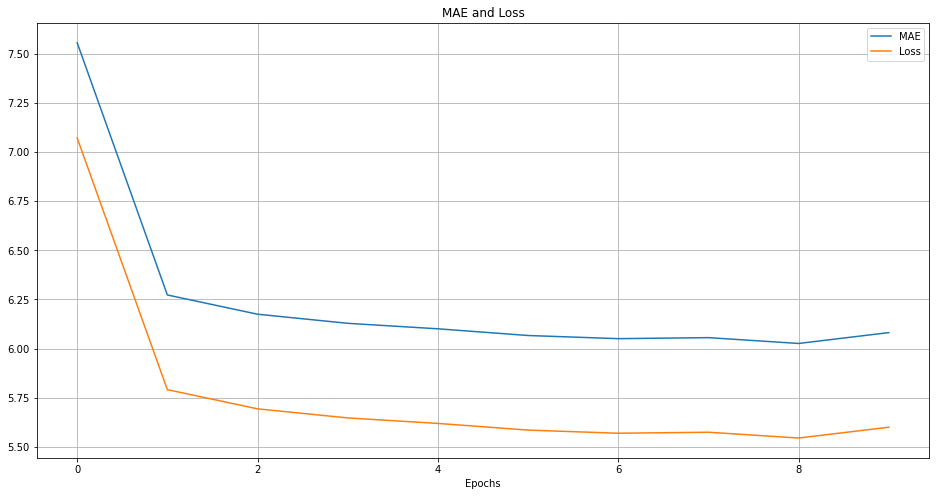

In [411]:
# Plot training loss

plot_series(
    x=range(len(history_rnn.history['loss'])), 
    y=(history_rnn.history['mae'], history_rnn.history['loss']), 
    title='MAE and Loss', 
    xlabel='Epochs',
    legend=['MAE', 'Loss']
    )

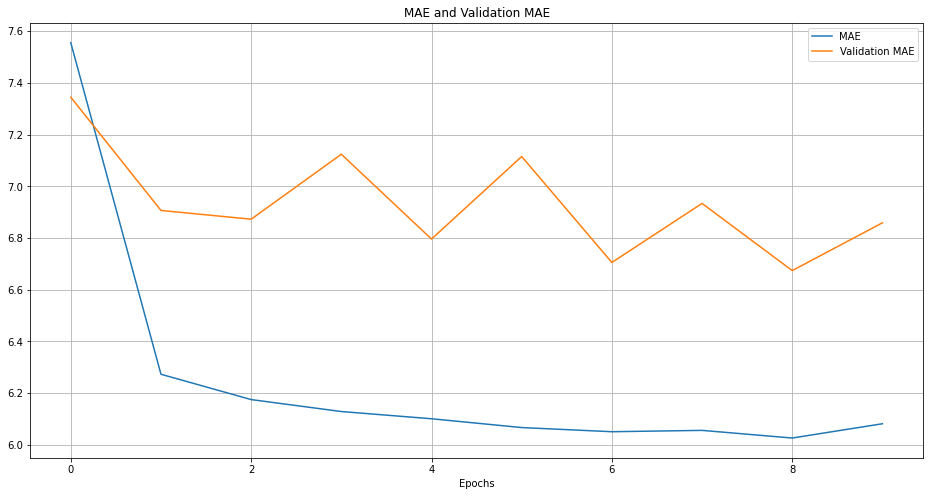

In [412]:
# Plot validation loss

plot_series(
    x=range(len(history_rnn.history['mae'])), 
    y=(history_rnn.history['mae'], history_rnn.history['val_mae']), 
    title='MAE and Validation MAE', 
    xlabel='Epochs',
    legend=['MAE', 'Validation MAE']
    )

In [414]:
# Make forecast

def model_forecast(model, series, window_size):
    """
    Creates a forecast from a batch.
    
    Args:
     model (network) - neural network
     series (array of int) - dataset for training and validating
     window_size (int) - horizon window of forecast
    
    """
    ds = tf.data.Dataset.from_tensor_slices(series)
    ds = ds.window(window_size, shift=1, drop_remainder=True)
    ds = ds.flat_map(lambda w: w.batch(window_size))
    ds = ds.batch(32).prefetch(1)
    forecast = model.predict(ds)
    return forecast

forecast_rnn = model_forecast(model_rnn, G.SERIES['sales'], G.WINDOW_SIZE).squeeze()
forecast_rnn = forecast_rnn[G.SPLIT_TIME-G.WINDOW_SIZE:-1]

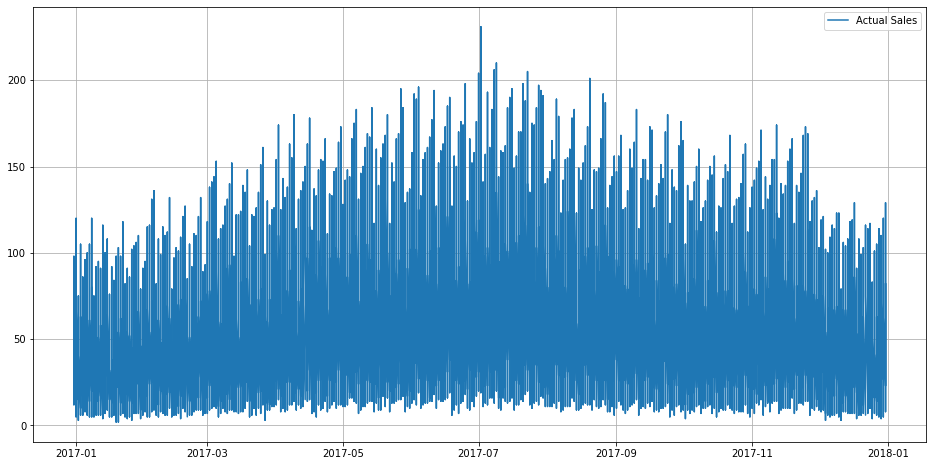

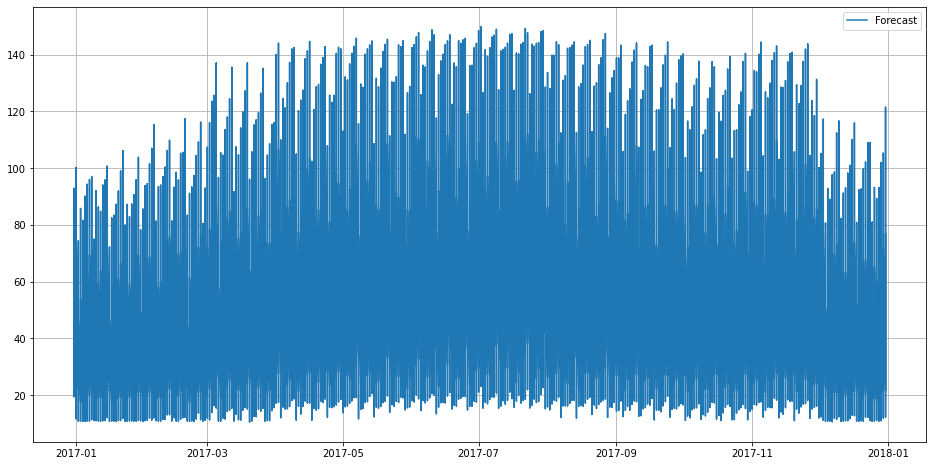

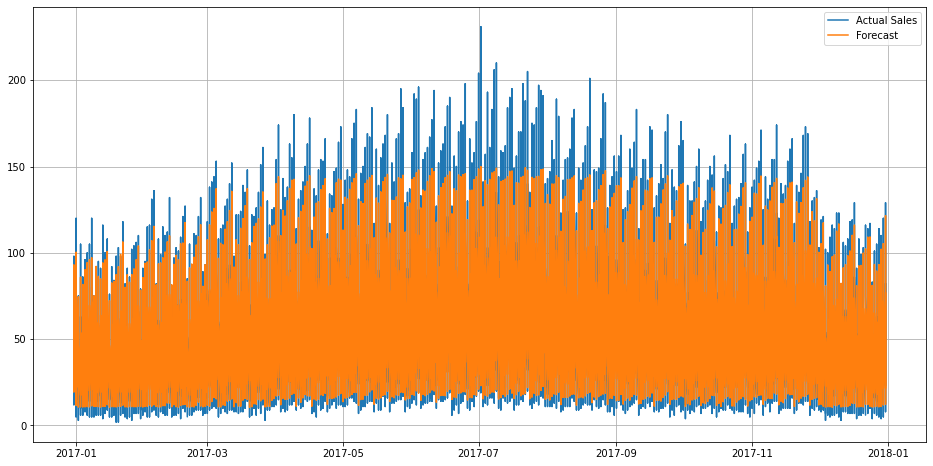

In [415]:
# Plot forecast

plot_series(time_valid, series_valid['sales'], legend=['Actual Sales'])
plot_series(time_valid, forecast_rnn, legend=['Forecast'])
plot_series(time_valid, (series_valid['sales'], forecast_rnn), legend=['Actual Sales', 'Forecast'])

In [416]:
# Evaluate results

def compute_metrics(true_series, forecast):
    """
    Evaluate forecast with MSE and MAE.
    
    Args:
     true_series (array of int) - dataset for validating
     forecast (array of int) - forecast from the model
     
    Output:
     mse (metric) - mean squared error
     mae (metric) - mean absolute error
    """
    mse = tf.keras.metrics.mean_squared_error(true_series, forecast).numpy()
    mae = tf.keras.metrics.mean_absolute_error(true_series, forecast).numpy()
    
    return mse, mae

mse, mae = compute_metrics(series_valid['sales'], forecast_rnn)
print(f"mse: {mse:.2f}, mae: {mae:.2f} for forecast")

mse: 83.82, mae: 6.86 for forecast


The model progressed well in training but eventually failed to generalize with unforseen data as we can see from the validation MAE that failed to stabilize. This could happen because the RNNs don't remember well the sequences that happened a long time in the past, so we will next try to see if the LSTM network could do a better forecast.

## LSTM Model

In [28]:
def LSTM_model():
    """
    Stacked LSTMs with a lambda layer to expand the dimensions of the input,
    followed by a group of dense layers.
    
    Layers:
     Lambda (layer) - expands input dimension to 3D 
     LSTM (layer) - stacked long short-term memory layers with 256 and 128 neurons
     Dense (layer) - stacked linear dense layers with 60, 40, 10 and 1 neurons
    
    """
    model = tf.keras.models.Sequential([
        tf.keras.layers.Lambda(lambda x: tf.expand_dims(x, axis=-1), input_shape=[G.WINDOW_SIZE]),
        tf.keras.layers.LSTM(256, return_sequences=True), 
        tf.keras.layers.LSTM(128),
        tf.keras.layers.Dense(60, activation='relu'),
        tf.keras.layers.Dense(40, activation='relu'),
        tf.keras.layers.Dense(10, activation='relu'),
        tf.keras.layers.Dense(1)       
    ], name='LSTM_model') 
    
    model.compile(loss=tf.keras.losses.Huber(),
                  optimizer=tf.keras.optimizers.Adam(),
                  metrics=["mae"])     

    return model

model_lstm = LSTM_model()
model_lstm.summary()

Model: "LSTM_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lambda_14 (Lambda)          (None, 29, 1)             0         
                                                                 
 lstm_14 (LSTM)              (None, 29, 256)           264192    
                                                                 
 lstm_15 (LSTM)              (None, 128)               197120    
                                                                 
 dense_48 (Dense)            (None, 60)                7740      
                                                                 
 dense_49 (Dense)            (None, 40)                2440      
                                                                 
 dense_50 (Dense)            (None, 10)                410       
                                                                 
 dense_51 (Dense)            (None, 1)                 1

In [418]:
# Train the model

history_lstm = model_lstm.fit(train_set, epochs=10, validation_data=val_set, callbacks=[callbacks])

Epoch 1/10
2029/2029 [==============================] - 2652s 1s/step - loss: 11.0441 - mae: 11.5318 - val_loss: 6.4755 - val_mae: 6.9587
Epoch 2/10
2029/2029 [==============================] - 2721s 1s/step - loss: 5.6385 - mae: 6.1195 - val_loss: 6.1051 - val_mae: 6.5871
Epoch 3/10
2029/2029 [==============================] - 2751s 1s/step - loss: 5.4858 - mae: 5.9664 - val_loss: 5.9816 - val_mae: 6.4637
Epoch 4/10
2029/2029 [==============================] - 2757s 1s/step - loss: 5.4445 - mae: 5.9249 - val_loss: 5.9710 - val_mae: 6.4531
Epoch 5/10
2029/2029 [==============================] - 2658s 1s/step - loss: 5.4177 - mae: 5.8980 - val_loss: 5.9149 - val_mae: 6.3970
Epoch 6/10
2029/2029 [==============================] - 2722s 1s/step - loss: 5.3979 - mae: 5.8781 - val_loss: 5.9358 - val_mae: 6.4177
Epoch 7/10
2029/2029 [==============================] - 2719s 1s/step - loss: 5.3781 - mae: 5.8584 - val_loss: 5.9758 - val_mae: 6.4579
Epoch 8/10
2029/2029 [========================

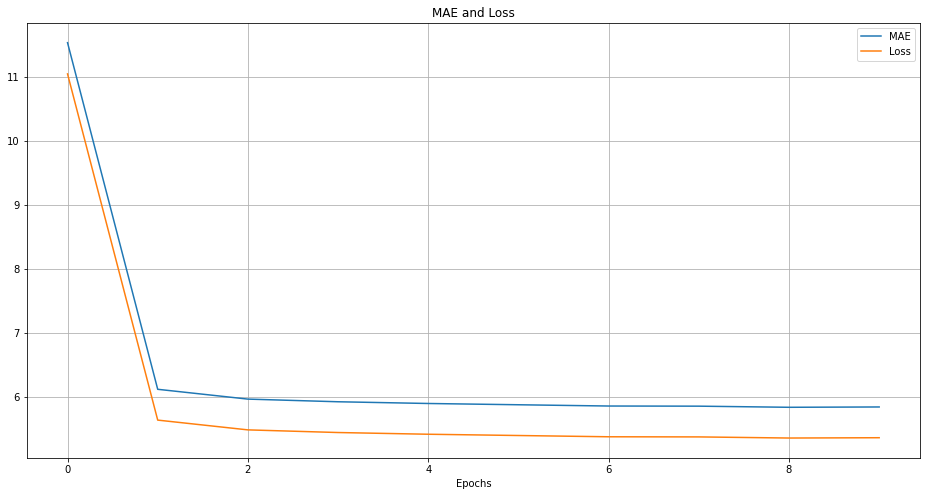

In [419]:
# Plot training loss

plot_series(
    x=range(len(history_lstm.history['loss'])), 
    y=(history_lstm.history['mae'], history_lstm.history['loss']), 
    title='MAE and Loss', 
    xlabel='Epochs',
    legend=['MAE', 'Loss']
    )

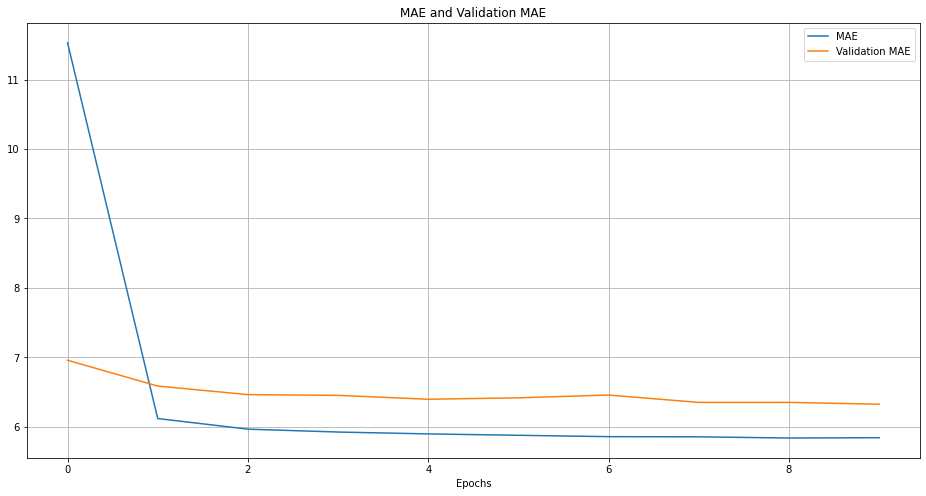

In [420]:
# Plot validation loss

plot_series(
    x=range(len(history_lstm.history['mae'])), 
    y=(history_lstm.history['mae'], history_lstm.history['val_mae']), 
    title='MAE and Validation MAE', 
    xlabel='Epochs',
    legend=['MAE', 'Validation MAE']
    )

In [421]:
# Make forecast

forecast_lstm = model_forecast(model_lstm, G.SERIES['sales'], G.WINDOW_SIZE).squeeze()
forecast_lstm = forecast_lstm[G.SPLIT_TIME-G.WINDOW_SIZE:-1]

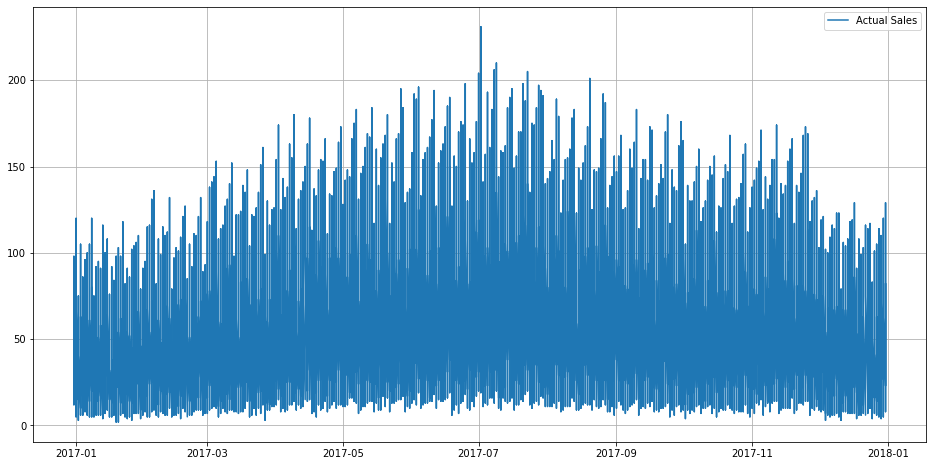

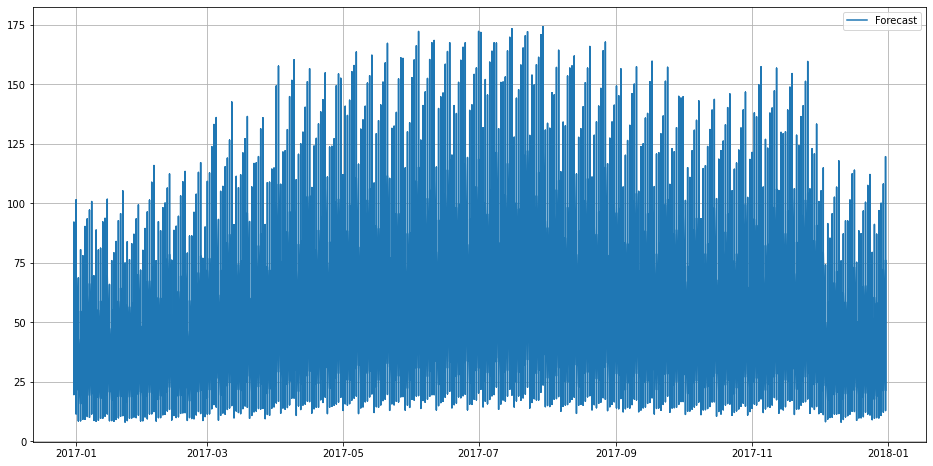

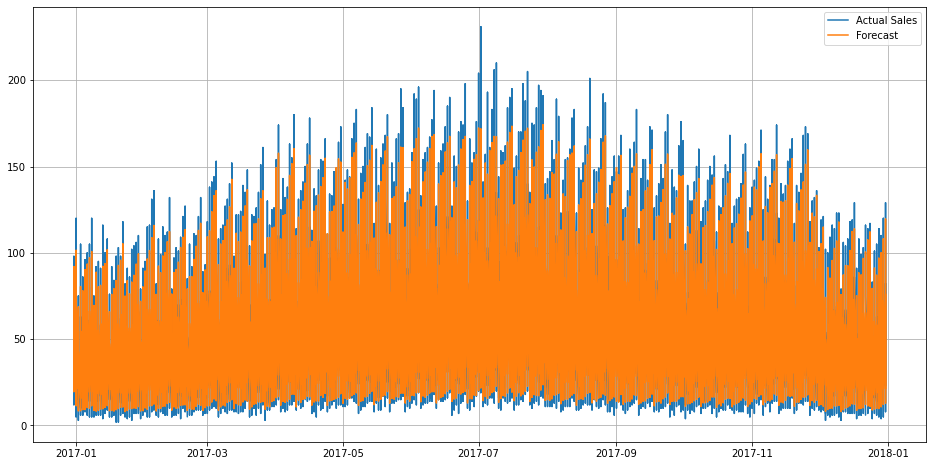

In [422]:
# Plot forecast

plot_series(time_valid, series_valid['sales'], legend=['Actual Sales'])
plot_series(time_valid, forecast_lstm, legend=['Forecast'])
plot_series(time_valid, (series_valid['sales'], forecast_lstm), legend=['Actual Sales', 'Forecast'])

In [423]:
# Evaluate results

mse, mae = compute_metrics(series_valid['sales'], forecast_lstm)
print(f"mse: {mse:.2f}, mae: {mae:.2f} for forecast")

mse: 68.47, mae: 6.33 for forecast


The results are quite good, especially compared to the previous ones. However we can see the training loss being quite a bit lower than the validation loss which could indicate of overfitting. We will try to adjust to this by changing how the model learns the sequences by using birectional LSTM where the information will run two ways: from the past to future and from the future to past.

## Bidirectional LSTM model

In [26]:
def BILSTM_model():
    """
    Stacked birectional LSTMs with a lambda layer to expand the dimensions of the input,
    followed by a group of dense layers.
    
    Layers:
     Lambda (layer) - expands input dimension to 3D 
     Bidirectional LSTM (layer) - stacked birectional long short-term memory layers with 256 and 128 neurons
     Dense (layer) - stacked linear dense layers with 60, 40, 10 and 1 neurons
    
    """
    model = tf.keras.models.Sequential([
        tf.keras.layers.Lambda(lambda x: tf.expand_dims(x, axis=-1), input_shape=[G.WINDOW_SIZE]),
        tf.keras.layers.Bidirectional(LSTM(256, return_sequences=True)), 
        tf.keras.layers.Bidirectional(LSTM(128)),
        tf.keras.layers.Dense(60, activation='relu'),
        tf.keras.layers.Dense(40, activation='relu'),
        tf.keras.layers.Dense(10, activation='relu'),
        tf.keras.layers.Dense(1)       
    ], name='Bidirectional-LSTM_model') 
    
    model.compile(loss=tf.keras.losses.Huber(),
                  optimizer=tf.keras.optimizers.Adam(),
                  metrics=["mae"])     

    return model

model_bilstm = BILSTM_model()
model_bilstm.summary()

Model: "Bidirectional-LSTM_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lambda_13 (Lambda)          (None, 29, 1)             0         
                                                                 
 bidirectional_4 (Bidirectio  (None, 29, 512)          528384    
 nal)                                                            
                                                                 
 bidirectional_5 (Bidirectio  (None, 256)              656384    
 nal)                                                            
                                                                 
 dense_44 (Dense)            (None, 60)                15420     
                                                                 
 dense_45 (Dense)            (None, 40)                2440      
                                                                 
 dense_46 (Dense)            (None, 10)   

In [27]:
# Train the model

history_bilstm = model_bilstm.fit(train_set, epochs=10, validation_data=val_set, callbacks=[callbacks])

Epoch 1/10
2029/2029 [==============================] - 2828s 1s/step - loss: 8.4037 - mae: 8.8886 - val_loss: 6.0201 - val_mae: 6.5027
Epoch 2/10
2029/2029 [==============================] - 2586s 1s/step - loss: 5.5017 - mae: 5.9825 - val_loss: 6.0087 - val_mae: 6.4906
Epoch 3/10
2029/2029 [==============================] - 2565s 1s/step - loss: 5.4494 - mae: 5.9299 - val_loss: 6.0007 - val_mae: 6.4826
Epoch 4/10
2029/2029 [==============================] - 2596s 1s/step - loss: 5.4231 - mae: 5.9035 - val_loss: 5.8716 - val_mae: 6.3533
Epoch 5/10
2029/2029 [==============================] - 2602s 1s/step - loss: 5.3984 - mae: 5.8787 - val_loss: 5.9524 - val_mae: 6.4341
Epoch 6/10
2029/2029 [==============================] - 2659s 1s/step - loss: 5.3875 - mae: 5.8675 - val_loss: 5.9233 - val_mae: 6.4051
Epoch 7/10
2029/2029 [==============================] - 2619s 1s/step - loss: 5.3761 - mae: 5.8562 - val_loss: 5.8347 - val_mae: 6.3164
Epoch 8/10
2029/2029 [==========================

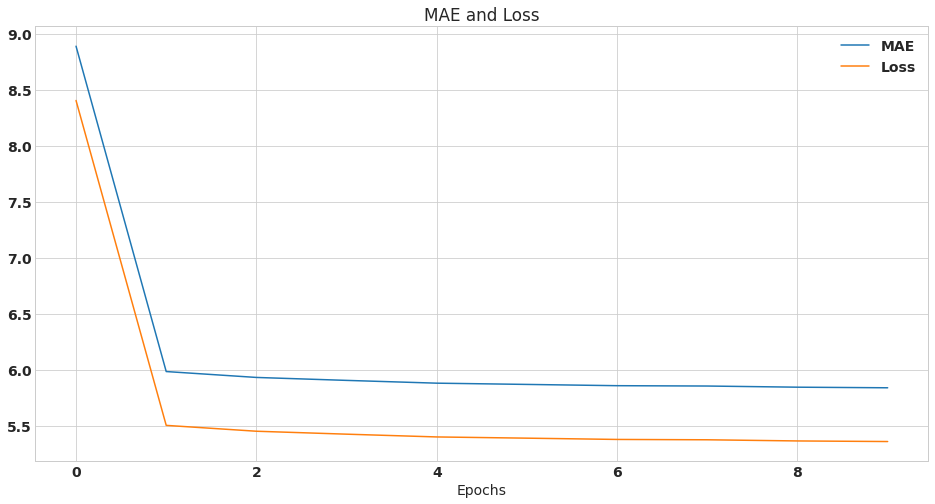

In [34]:
# Plot training loss

plot_series(
    x=range(len(history_bilstm.history['loss'])), 
    y=(history_bilstm.history['mae'], history_bilstm.history['loss']), 
    title='MAE and Loss', 
    xlabel='Epochs',
    legend=['MAE', 'Loss']
    )

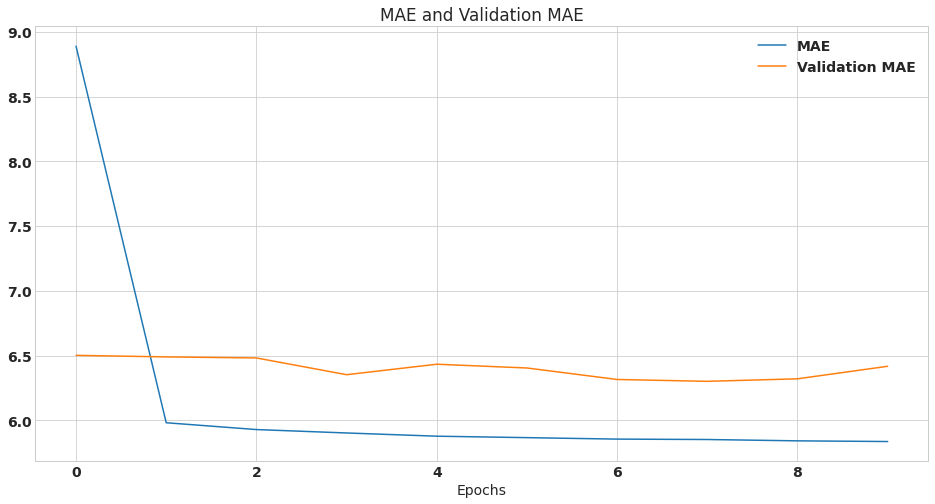

In [35]:
# Plot validation loss

plot_series(
    x=range(len(history_bilstm.history['mae'])), 
    y=(history_bilstm.history['mae'], history_bilstm.history['val_mae']), 
    title='MAE and Validation MAE', 
    xlabel='Epochs',
    legend=['MAE', 'Validation MAE']
    )

In [37]:
# Make forecast

forecast_bilstm = model_forecast(model_bilstm, G.SERIES['sales'], G.WINDOW_SIZE).squeeze()
forecast_bilstm = forecast_bilstm[G.SPLIT_TIME-G.WINDOW_SIZE:-1]

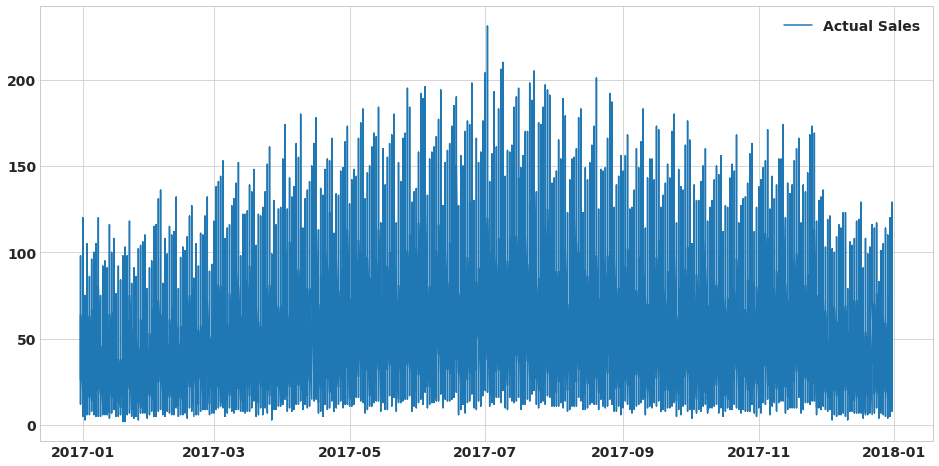

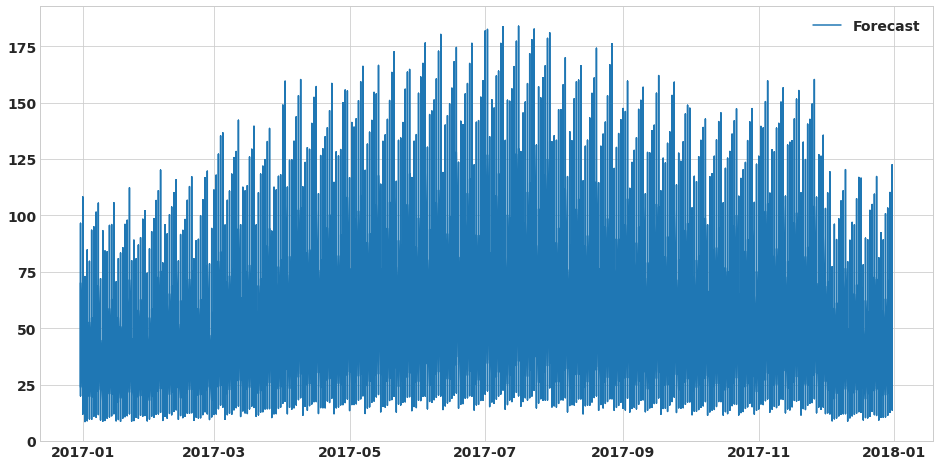

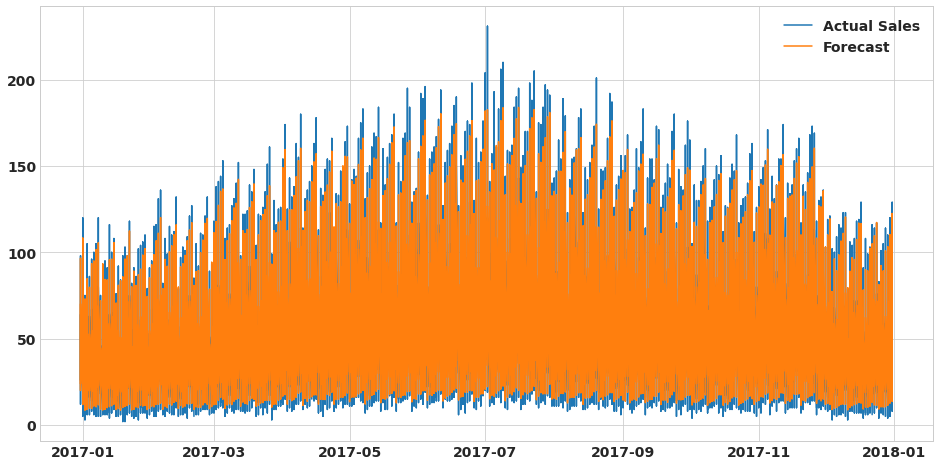

In [38]:
# Plot forecast

plot_series(time_valid, series_valid['sales'], legend=['Actual Sales'])
plot_series(time_valid, forecast_bilstm, legend=['Forecast'])
plot_series(time_valid, (series_valid['sales'], forecast_bilstm), legend=['Actual Sales', 'Forecast'])

In [40]:
# Evaluate results

mse, mae = compute_metrics(series_valid['sales'], forecast_bilstm)
print(f"mse: {mse:.2f}, mae: {mae:.2f} for forecast")

mse: 69.81, mae: 6.42 for forecast


The results were very similar to the previous model, but the training did took more time. Next we introduce a new element with a convolutional layer combined with maxpooling to enhance the feature extraction.

##  LSTM + CNN Model

In [30]:
def LSTM_CNN_model():
    """
    Stacked LSTMs with feature extraction from convolutional filters and maxpooling.
    
    Layers:
     Conv1D (layer) - 1D convolational neural network layer with 128 filters of size 3
     MaxPooling1D (layers) - enhances the results from the convolutional layer
     LSTM (layer) - stacked long short-term memory layers with 256 and 128 neurons
     Dense (layer) - stacked linear dense layers with 60, 40, 10 and 1 neurons
    
    """
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv1D(filters=128, kernel_size=3, strides=1, activation='relu', padding='causal', input_shape=[G.WINDOW_SIZE, 1]),
        tf.keras.layers.MaxPooling1D(pool_size=2),
        tf.keras.layers.LSTM(256, return_sequences=True), 
        tf.keras.layers.LSTM(128),
        tf.keras.layers.Dense(60, activation='relu'),
        tf.keras.layers.Dense(40, activation='relu'),
        tf.keras.layers.Dense(10, activation='relu'),
        tf.keras.layers.Dense(1)      
    ], name='LSTM-CNN_model') 
    
    model.compile(loss=tf.keras.losses.Huber(),
                  optimizer=tf.keras.optimizers.Adam(),
                  metrics=["mae"])     

    return model

model_lstm_cnn = LSTM_CNN_model()
model_lstm_cnn.summary()

Model: "LSTM-CNN_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_5 (Conv1D)           (None, 29, 128)           512       
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 14, 128)          0         
 1D)                                                             
                                                                 
 lstm_16 (LSTM)              (None, 14, 256)           394240    
                                                                 
 lstm_17 (LSTM)              (None, 128)               197120    
                                                                 
 dense_56 (Dense)            (None, 60)                7740      
                                                                 
 dense_57 (Dense)            (None, 40)                2440      
                                                    

In [425]:
# Train the model

history_lstm_cnn = model_lstm_cnn.fit(train_set, epochs=10, validation_data=val_set, callbacks=[callbacks])

Epoch 1/10
2029/2029 [==============================] - 1662s 817ms/step - loss: 8.2343 - mae: 8.7190 - val_loss: 6.3359 - val_mae: 6.8187
Epoch 2/10
2029/2029 [==============================] - 1608s 792ms/step - loss: 5.6482 - mae: 6.1291 - val_loss: 6.1262 - val_mae: 6.6083
Epoch 3/10
2029/2029 [==============================] - 1713s 844ms/step - loss: 5.5703 - mae: 6.0509 - val_loss: 6.4963 - val_mae: 6.9791
Epoch 4/10
2029/2029 [==============================] - 1615s 796ms/step - loss: 5.5357 - mae: 6.0162 - val_loss: 6.0406 - val_mae: 6.5222
Epoch 5/10
2029/2029 [==============================] - 1591s 784ms/step - loss: 5.5126 - mae: 5.9931 - val_loss: 6.0417 - val_mae: 6.5231
Epoch 6/10
2029/2029 [==============================] - 1571s 774ms/step - loss: 5.4931 - mae: 5.9734 - val_loss: 6.1210 - val_mae: 6.6037
Epoch 7/10
2029/2029 [==============================] - 1600s 788ms/step - loss: 5.4759 - mae: 5.9562 - val_loss: 5.9805 - val_mae: 6.4623
Epoch 8/10
2029/2029 [=====

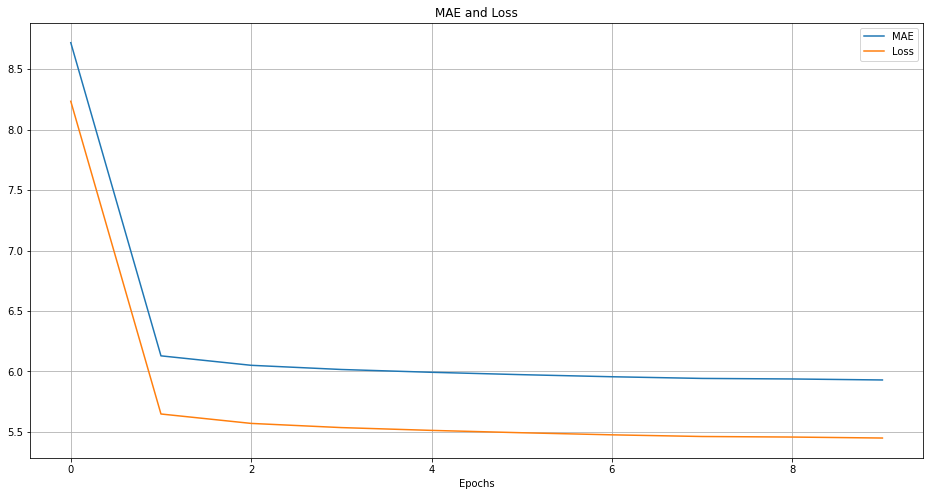

In [426]:
# Plot training loss

plot_series(
    x=range(len(history_lstm_cnn.history['loss'])), 
    y=(history_lstm_cnn.history['mae'], history_lstm_cnn.history['loss']), 
    title='MAE and Loss', 
    xlabel='Epochs',
    legend=['MAE', 'Loss']
    )

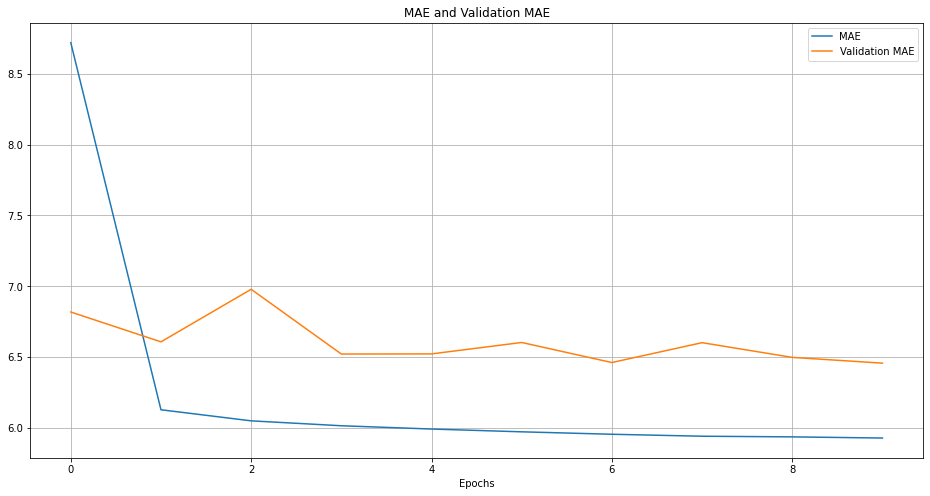

In [427]:
# Plot validation loss

plot_series(
    x=range(len(history_lstm_cnn.history['mae'])), 
    y=(history_lstm_cnn.history['mae'], history_lstm_cnn.history['val_mae']), 
    title='MAE and Validation MAE', 
    xlabel='Epochs',
    legend=['MAE', 'Validation MAE']
    )

In [428]:
# Make forecast

forecast_lstm_cnn = model_forecast(model_lstm_cnn, G.SERIES['sales'], G.WINDOW_SIZE).squeeze()
forecast_lstm_cnn = forecast_lstm_cnn[G.SPLIT_TIME-G.WINDOW_SIZE:-1]

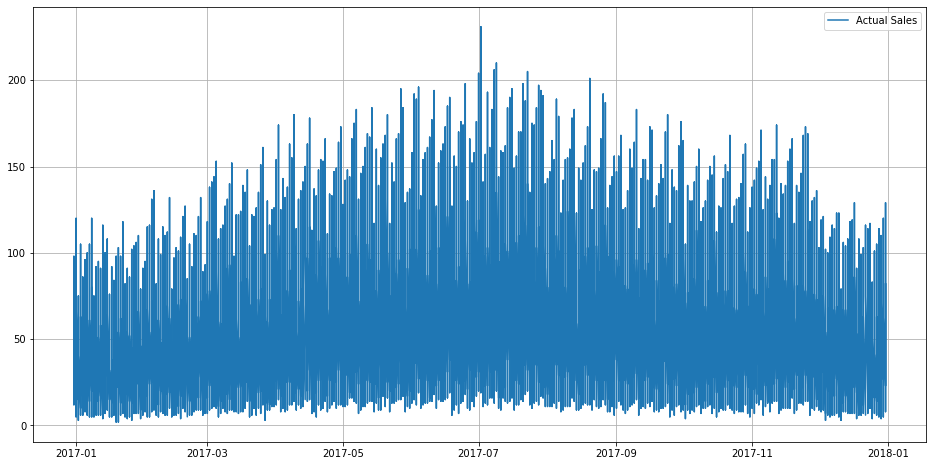

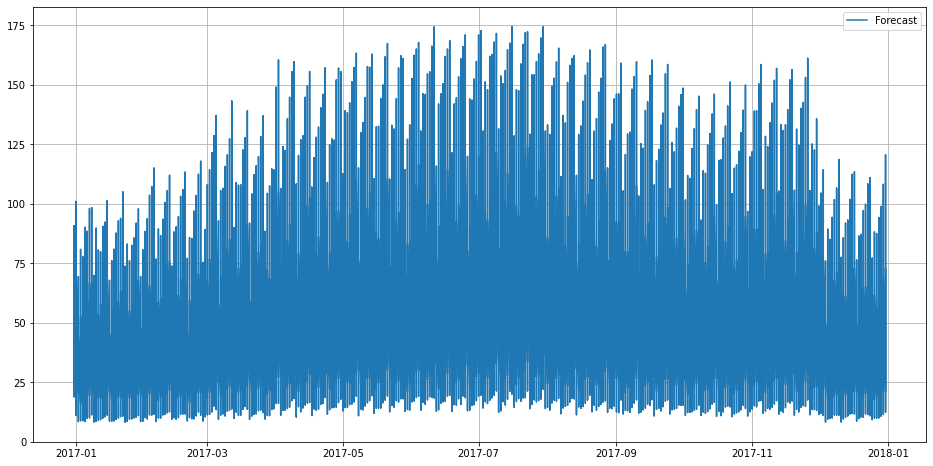

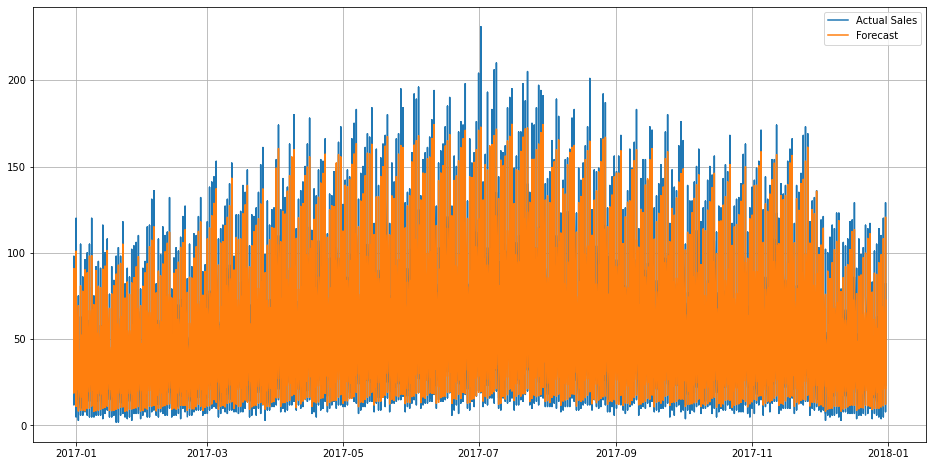

In [429]:
# Plot forecast

plot_series(time_valid, series_valid['sales'], legend=['Actual Sales'])
plot_series(time_valid, forecast_lstm_cnn, legend=['Forecast'])
plot_series(time_valid, (series_valid['sales'], forecast_lstm_cnn), legend=['Actual Sales', 'Forecast'])

In [430]:
# Evaluate results

mse, mae = compute_metrics(series_valid['sales'], forecast_lstm_cnn)
print(f"mse: {mse:.2f}, mae: {mae:.2f} for forecast")

mse: 74.16, mae: 6.46 for forecast


The training took less time compared to the previous model, but the results didn't improve unfortunately, so next, we will try stacking another convulational layer to try to catch more sequeces that can hopefully help speed-up the learning curve and stabilize the learning process.

## Double-Stacked LSTMs +  CNNs model

In [31]:
# The CNN-LSTM model

def CNN_LSTM_model():
    """
    Stacked Convolutional filters with maxpooling for feature extraction.
    Stacked LSTMs to process sequences.
    
    Layers:
     Conv1D (layer) - 1D convolutional neural network layer with 128 filters of size 3
     MaxPooling1D (layers) - enhances the results from the convolutional layer
     LSTM (layer) - stacked long short-term memory layers with 256 and 128 neurons
     Dense (layer) - stacked linear dense layers with 60, 40, 10 and 1 neurons
    
    """ 
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv1D(filters=256, kernel_size=3, strides=1, activation='relu', padding='causal', input_shape=[G.WINDOW_SIZE, 1]),
        tf.keras.layers.Conv1D(filters=128, kernel_size=6, strides=1, activation='relu', padding='causal'),
        tf.keras.layers.MaxPooling1D(pool_size=2),
        tf.keras.layers.LSTM(256, return_sequences=True), 
        tf.keras.layers.LSTM(128),
        tf.keras.layers.Dense(60, activation='relu'),
        tf.keras.layers.Dense(40, activation='relu'),
        tf.keras.layers.Dense(10, activation='relu'),
        tf.keras.layers.Dense(1),        
    ], name = 'CNN-LSTM_model') 
    
    model.compile(loss=tf.keras.losses.Huber(),
                  optimizer=tf.keras.optimizers.Adam(),
                  metrics=["mae"])    

    return model

model_cnn_lstm = CNN_LSTM_model()
model_cnn_lstm.summary()

Model: "CNN-LSTM_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_6 (Conv1D)           (None, 29, 256)           1024      
                                                                 
 conv1d_7 (Conv1D)           (None, 29, 128)           196736    
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 14, 128)          0         
 1D)                                                             
                                                                 
 lstm_18 (LSTM)              (None, 14, 256)           394240    
                                                                 
 lstm_19 (LSTM)              (None, 128)               197120    
                                                                 
 dense_60 (Dense)            (None, 60)                7740      
                                                    

In [52]:
# Training the model 10 epochs

history_cnn_lstm = model_cnn_lstm.fit(train_set, epochs=10, validation_data=val_set, callbacks=[callbacks])

Epoch 1/10
2029/2029 [==============================] - 1029s 505ms/step - loss: 7.3239 - mae: 7.8080 - val_loss: 6.4709 - val_mae: 6.9546
Epoch 2/10
2029/2029 [==============================] - 1096s 539ms/step - loss: 5.7453 - mae: 6.2266 - val_loss: 6.3480 - val_mae: 6.8303
Epoch 3/10
2029/2029 [==============================] - 1074s 529ms/step - loss: 5.6232 - mae: 6.1041 - val_loss: 6.1466 - val_mae: 6.6286
Epoch 4/10
2029/2029 [==============================] - 1137s 560ms/step - loss: 5.5869 - mae: 6.0676 - val_loss: 6.1822 - val_mae: 6.6643
Epoch 5/10
2029/2029 [==============================] - 1134s 559ms/step - loss: 5.5496 - mae: 6.0301 - val_loss: 6.0782 - val_mae: 6.5603
Epoch 6/10
2029/2029 [==============================] - 1023s 504ms/step - loss: 5.5308 - mae: 6.0115 - val_loss: 6.0390 - val_mae: 6.5209
Epoch 7/10
2029/2029 [==============================] - 1030s 507ms/step - loss: 5.5090 - mae: 5.9894 - val_loss: 6.0218 - val_mae: 6.5037
Epoch 8/10
2029/2029 [=====

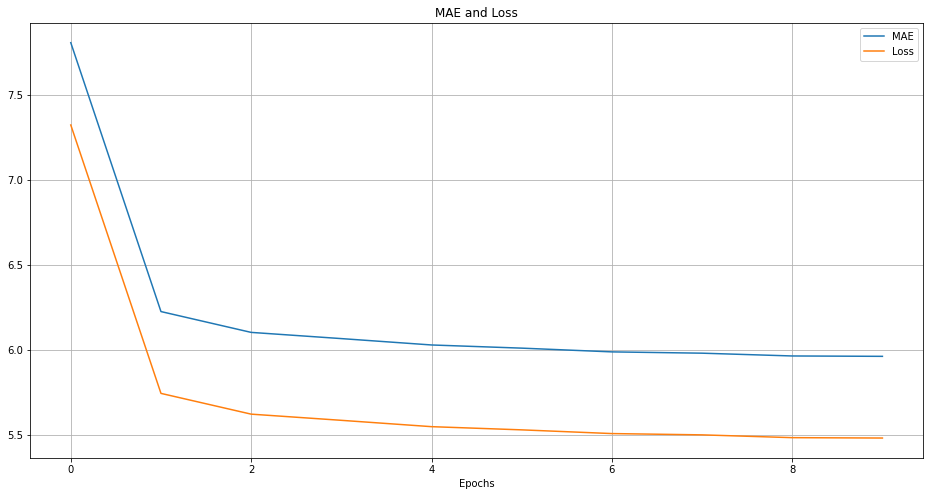

In [53]:
# Plot training loss

plot_series(
    x=range(len(history_cnn_lstm.history['loss'])), 
    y=(history_cnn_lstm.history['mae'], history_cnn_lstm.history['loss']), 
    title='MAE and Loss', 
    xlabel='Epochs',
    legend=['MAE', 'Loss']
    )

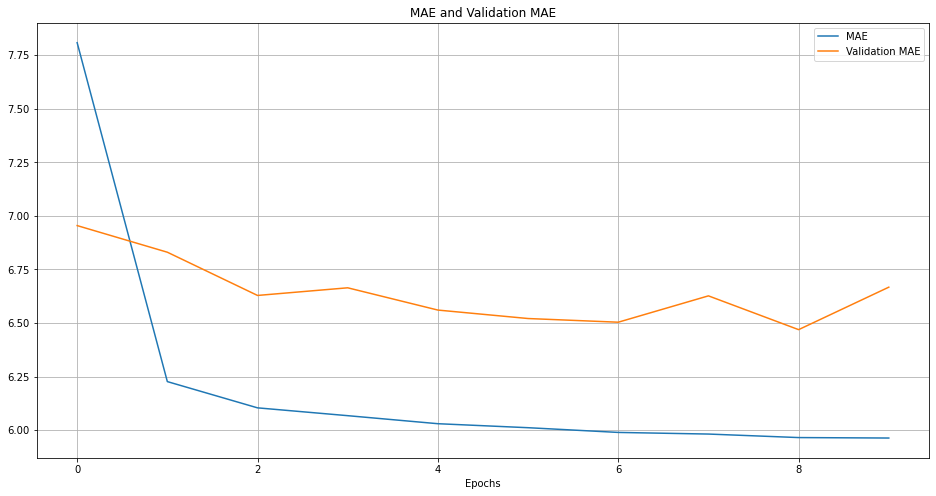

In [54]:
# Plot evaluation loss

plot_series(
    x=range(len(history_cnn_lstm.history['mae'])), 
    y=(history_cnn_lstm.history['mae'], history_cnn_lstm.history['val_mae']), 
    title='MAE and Validation MAE', 
    xlabel='Epochs',
    legend=['MAE', 'Validation MAE']
    )

In [55]:
# Make forecast

forecast_cnn_lstm = model_forecast(model_cnn_lstm, G.SERIES['sales'], G.WINDOW_SIZE).squeeze()
forecast_cnn_lstm = forecast_cnn_lstm[G.SPLIT_TIME-G.WINDOW_SIZE:-1]

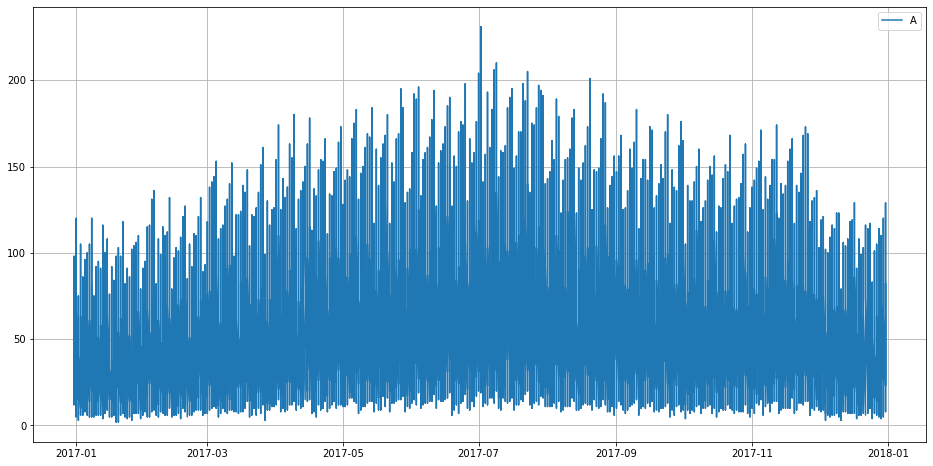

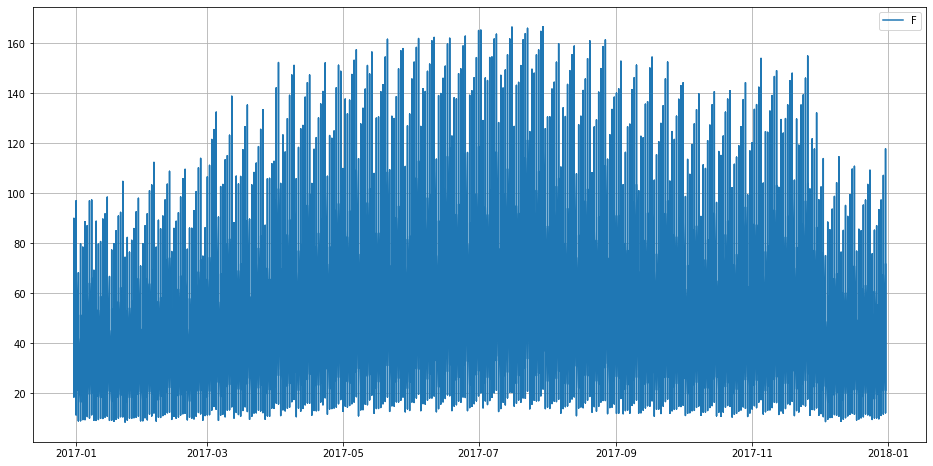

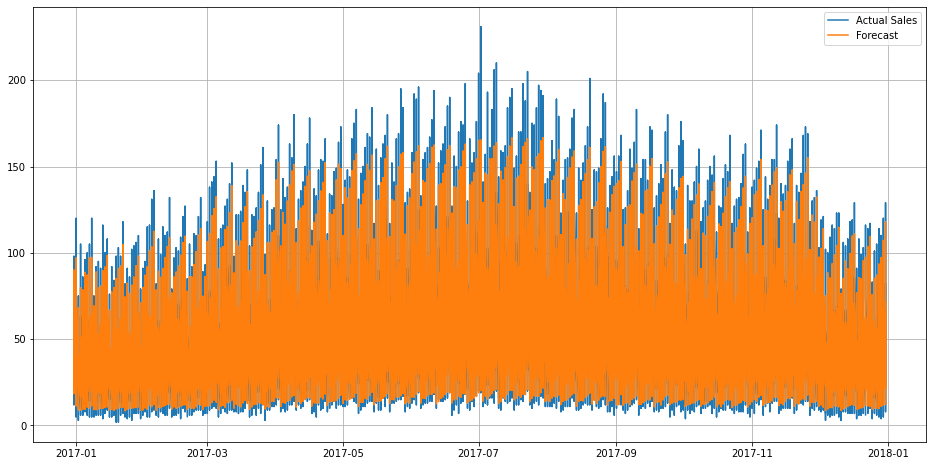

In [56]:
# Plot forecast

plot_series(time_valid, series_valid['sales'], legend='Actual Sales')
plot_series(time_valid, forecast_cnn_lstm, legend='Forecast')
plot_series(time_valid, (series_valid['sales'], forecast_cnn_lstm), legend=['Actual Sales', 'Forecast'])

In [57]:
# Evaluate results

mse, mae = compute_metrics(series_valid['sales'], forecast_cnn_lstm)
print(f"mse: {mse:.2f}, mae: {mae:.2f} for forecast")

mse: 80.05, mae: 6.67 for forecast


The training didn't improve and it seems that making the model architecture more complex by adding an extra convolutional layer made the model less able to generalize well, so we will try to make the model again simpler by introducing gated recurrent units.

## GRU Model

In [32]:
def GRU_model():
    """
    Stacked GRUs with a Lambda layer to expand the dimensions of the input,
    followed by a group of dense layers.
    
    Layers:
     Lambda (layer) - expands input dimension to 3D 
     GRU (layer) - staked gated recurrent units with 256 and 128 neurons
     Dense (layer) - stacked linear dense layers with 60, 40, 10 and 1 neurons    
    
    """
    model = tf.keras.models.Sequential([
        tf.keras.layers.Lambda(lambda x: tf.expand_dims(x, axis=-1), input_shape=[G.WINDOW_SIZE]),
        tf.keras.layers.GRU(256, return_sequences=True), 
        tf.keras.layers.GRU(128),
        tf.keras.layers.Dense(60, activation='relu'),
        tf.keras.layers.Dense(40, activation='relu'),
        tf.keras.layers.Dense(10, activation='relu'),
        tf.keras.layers.Dense(1)     
    ], name = 'GRU_model') 
    
    model.compile(loss=tf.keras.losses.Huber(),
                  optimizer=tf.keras.optimizers.Adam(),
                  metrics=["mae"])     

    return model

model_gru = GRU_model()
model_gru.summary()

Model: "GRU_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lambda_17 (Lambda)          (None, 29, 1)             0         
                                                                 
 gru_4 (GRU)                 (None, 29, 256)           198912    
                                                                 
 gru_5 (GRU)                 (None, 128)               148224    
                                                                 
 dense_64 (Dense)            (None, 60)                7740      
                                                                 
 dense_65 (Dense)            (None, 40)                2440      
                                                                 
 dense_66 (Dense)            (None, 10)                410       
                                                                 
 dense_67 (Dense)            (None, 1)                 11

In [28]:
# Training the model 10 epochs

history_gru = model_gru.fit(train_set, epochs=10, validation_data=val_set, callbacks=[callbacks])

Epoch 1/10
2029/2029 [==============================] - 816s 400ms/step - loss: 7.5589 - mae: 8.0427 - val_loss: 6.0879 - val_mae: 6.5699
Epoch 2/10
2029/2029 [==============================] - 863s 425ms/step - loss: 5.4501 - mae: 5.9305 - val_loss: 5.9149 - val_mae: 6.3967
Epoch 3/10
2029/2029 [==============================] - 886s 436ms/step - loss: 5.4011 - mae: 5.8812 - val_loss: 5.9970 - val_mae: 6.4787
Epoch 4/10
2029/2029 [==============================] - 888s 437ms/step - loss: 5.3844 - mae: 5.8646 - val_loss: 5.8499 - val_mae: 6.3318
Epoch 5/10
2029/2029 [==============================] - 916s 451ms/step - loss: 5.3744 - mae: 5.8545 - val_loss: 6.0024 - val_mae: 6.4842
Epoch 6/10
2029/2029 [==============================] - 930s 458ms/step - loss: 5.3659 - mae: 5.8461 - val_loss: 5.8515 - val_mae: 6.3331
Epoch 7/10
2029/2029 [==============================] - 932s 459ms/step - loss: 5.3571 - mae: 5.8373 - val_loss: 6.0447 - val_mae: 6.5265
Epoch 8/10
2029/2029 [============

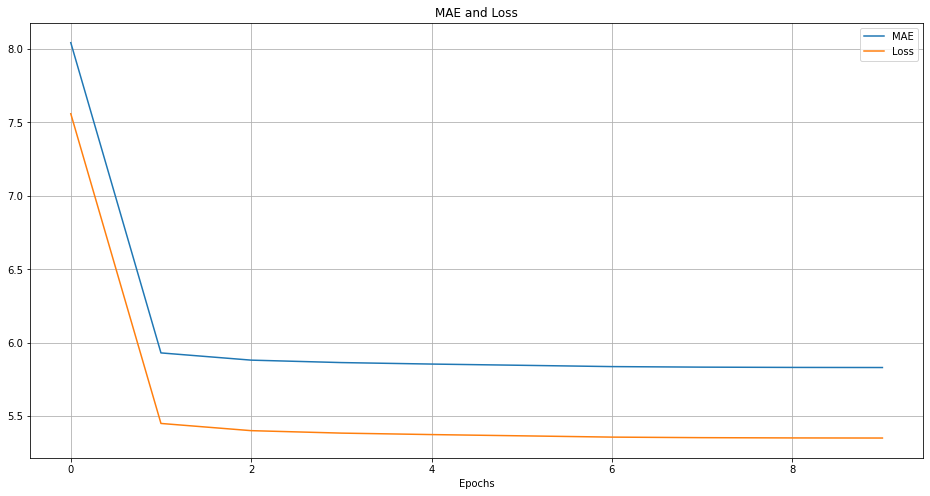

In [29]:
# Plot training loss

plot_series(
    x=range(len(history_gru.history['loss'])), 
    y=(history_gru.history['mae'], history_gru.history['loss']), 
    title='MAE and Loss', 
    xlabel='Epochs',
    legend=['MAE', 'Loss']
    )

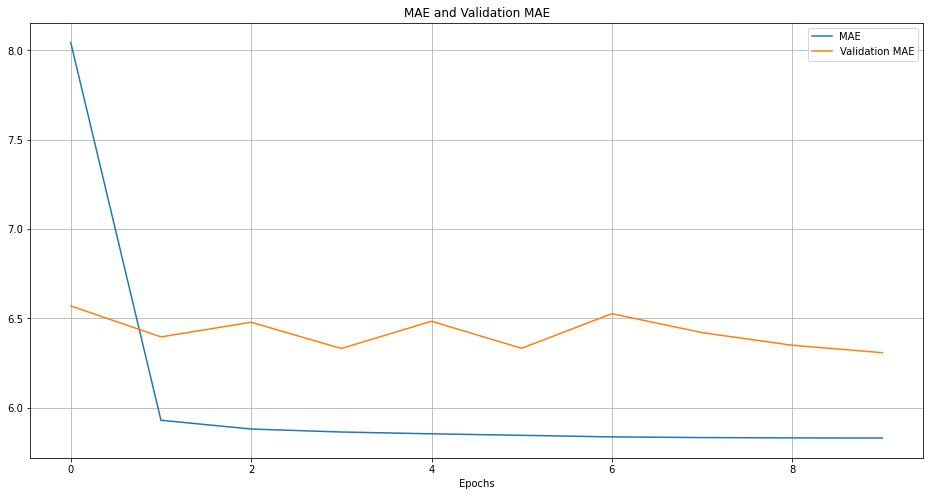

In [30]:
# Plot evaluation loss

plot_series(
    x=range(len(history_gru.history['mae'])), 
    y=(history_gru.history['mae'], history_gru.history['val_mae']), 
    title='MAE and Validation MAE', 
    xlabel='Epochs',
    legend=['MAE', 'Validation MAE']
    )

In [31]:
# Make forecast

forecast_gru = model_forecast(model_gru, G.SERIES['sales'], G.WINDOW_SIZE).squeeze()
forecast_gru = forecast_gru[G.SPLIT_TIME-G.WINDOW_SIZE:-1]

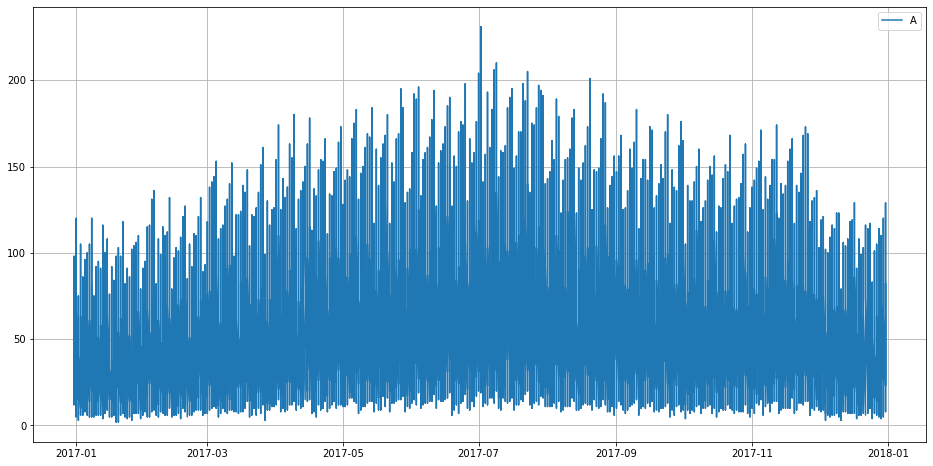

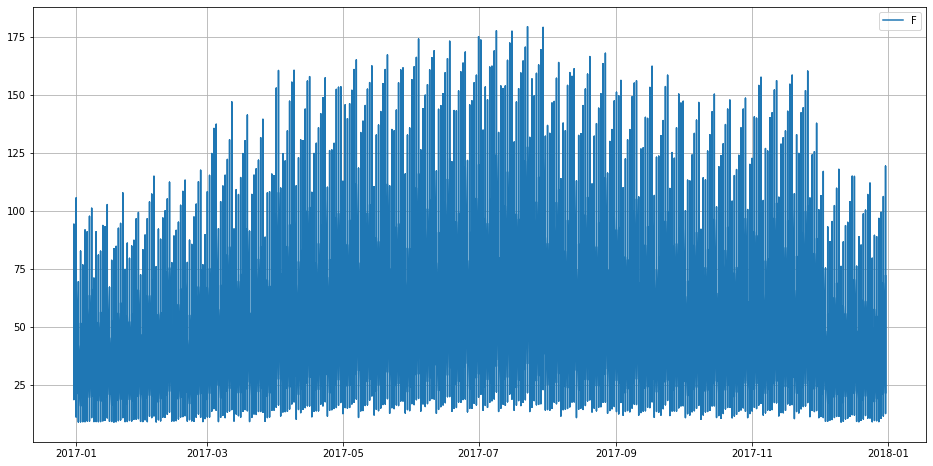

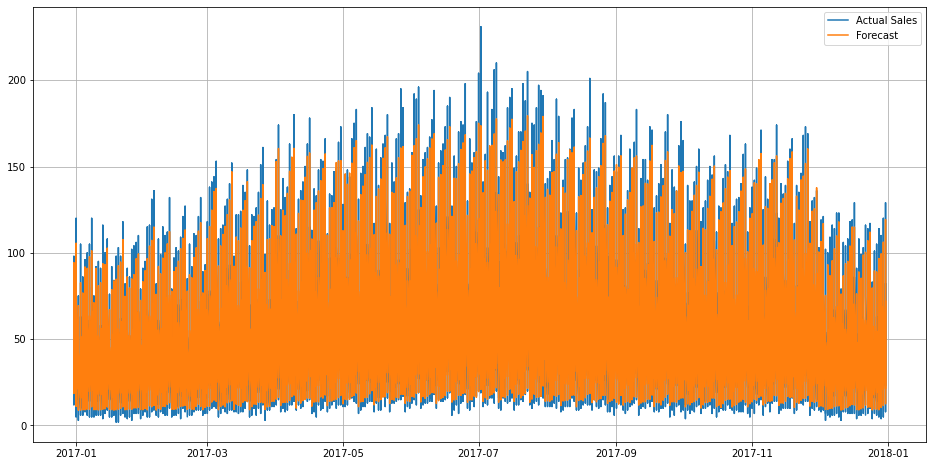

In [32]:
# Plot forecast

plot_series(time_valid, series_valid['sales'], legend='Actual Sales')
plot_series(time_valid, forecast_gru, legend='Forecast')
plot_series(time_valid, (series_valid['sales'], forecast_gru), legend=['Actual Sales', 'Forecast'])

In [34]:
# Evaluate results

mse, mae = compute_metrics(series_valid['sales'], forecast_gru)
print(f"mse: {mse:.2f}, mae: {mae:.2f} for forecast")

mse: 68.35, mae: 6.31 for forecast


This is the best performance so far. The training time progressed rapidly, eventually achieving also the best results from all the other models. However, the learning process seemed to come to a halt after couple epochs, as there was no real progress made with the evaluation set, and the progress didn't manage to stabilize.  We could still try to improve the learning process by introducing convulutional layers so we will try that next.

## GRU + CNN Model

In [33]:
def GRU_CNN_model():
    '''
    Stacked GRUs with feature extraction from convolutional filters and maxpooling.
    
    Layers:
     Conv1D (layer) - 1D convolutional neural network with 128 filters of size 3
     MaxPooling1D (layers) - enhances the results from the convolutional layer
     GRU (layer) - gated recurrent unit with 256 and 128 neutrons
     Dense (layer) - linear dense layer with 60, 40, 10 and 1 neutrons
    '''
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv1D(filters=128, kernel_size=3, strides=1, activation='relu', padding='causal', input_shape=[G.WINDOW_SIZE, 1]),
        tf.keras.layers.MaxPooling1D(pool_size=2),
        tf.keras.layers.GRU(256, return_sequences=True), 
        tf.keras.layers.GRU(128),
        tf.keras.layers.Dense(60, activation='relu'),
        tf.keras.layers.Dense(40, activation='relu'),
        tf.keras.layers.Dense(10, activation='relu'),
        tf.keras.layers.Dense(1)
        
    ], name = 'GRU-CNN_model') 
    
    model.compile(loss=tf.keras.losses.Huber(),
                  optimizer=tf.keras.optimizers.Adam(),
                  metrics=["mae"])     

    return model

model_gru_cnn = GRU_CNN_model()
model_gru_cnn.summary()

Model: "GRU-CNN_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_8 (Conv1D)           (None, 29, 128)           512       
                                                                 
 max_pooling1d_6 (MaxPooling  (None, 14, 128)          0         
 1D)                                                             
                                                                 
 gru_6 (GRU)                 (None, 14, 256)           296448    
                                                                 
 gru_7 (GRU)                 (None, 128)               148224    
                                                                 
 dense_68 (Dense)            (None, 60)                7740      
                                                                 
 dense_69 (Dense)            (None, 40)                2440      
                                                     

In [37]:
# Training the model 10 epochs

history_gru_cnn = model_gru_cnn.fit(train_set, epochs=10, validation_data=val_set, callbacks=[callbacks])

Epoch 1/10
2029/2029 [==============================] - 563s 276ms/step - loss: 7.2966 - mae: 7.7802 - val_loss: 6.2688 - val_mae: 6.7511
Epoch 2/10
2029/2029 [==============================] - 550s 271ms/step - loss: 5.6356 - mae: 6.1164 - val_loss: 6.1624 - val_mae: 6.6445
Epoch 3/10
2029/2029 [==============================] - 544s 268ms/step - loss: 5.5640 - mae: 6.0446 - val_loss: 6.1071 - val_mae: 6.5892
Epoch 4/10
2029/2029 [==============================] - 575s 283ms/step - loss: 5.5304 - mae: 6.0109 - val_loss: 6.0319 - val_mae: 6.5139
Epoch 5/10
2029/2029 [==============================] - 598s 294ms/step - loss: 5.5089 - mae: 5.9894 - val_loss: 6.2050 - val_mae: 6.6869
Epoch 6/10
2029/2029 [==============================] - 592s 291ms/step - loss: 5.4930 - mae: 5.9734 - val_loss: 6.1052 - val_mae: 6.5873
Epoch 7/10
2029/2029 [==============================] - 580s 285ms/step - loss: 5.4871 - mae: 5.9674 - val_loss: 6.1569 - val_mae: 6.6389
Epoch 8/10
2029/2029 [============

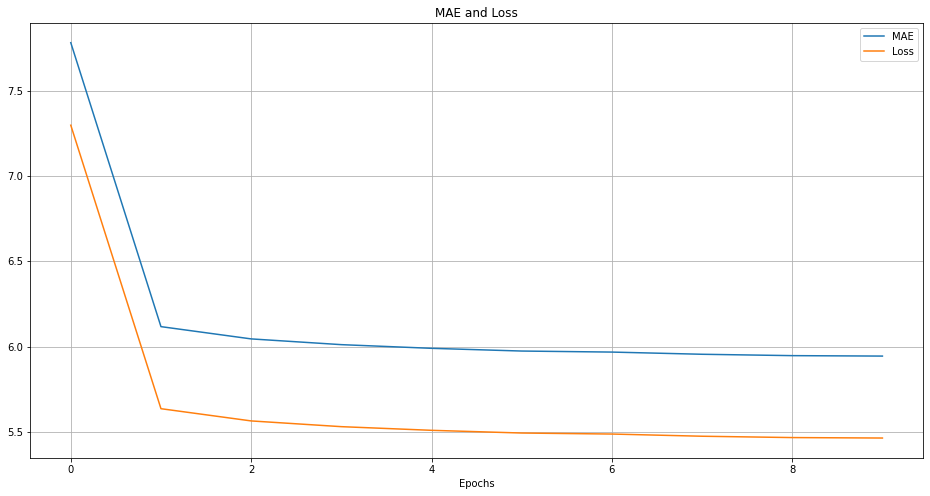

In [38]:
# Plot training loss

plot_series(
    x=range(len(history_gru_cnn.history['loss'])), 
    y=(history_gru_cnn.history['mae'], history_gru_cnn.history['loss']), 
    title='MAE and Loss', 
    xlabel='Epochs',
    legend=['MAE', 'Loss']
    )

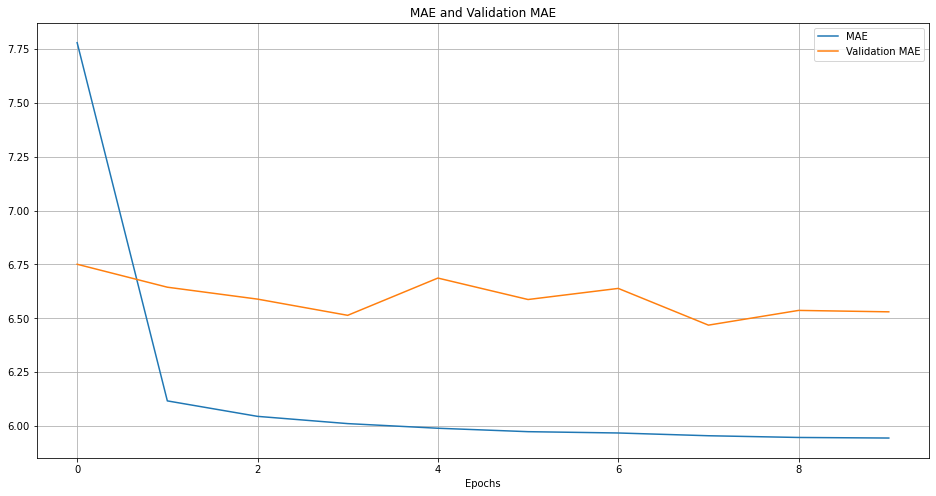

In [39]:
# Plot evaluation loss

plot_series(
    x=range(len(history_gru_cnn.history['mae'])), 
    y=(history_gru_cnn.history['mae'], history_gru_cnn.history['val_mae']), 
    title='MAE and Validation MAE', 
    xlabel='Epochs',
    legend=['MAE', 'Validation MAE']
    )

In [40]:
# Make forecast

forecast_gru_cnn = model_forecast(model_gru_cnn, G.SERIES['sales'], G.WINDOW_SIZE).squeeze()
forecast_gru_cnn = forecast_gru_cnn[G.SPLIT_TIME-G.WINDOW_SIZE:-1]

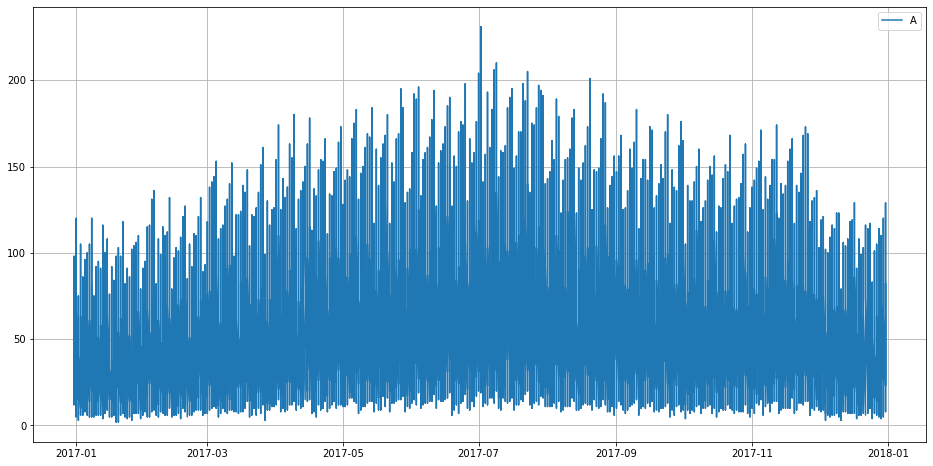

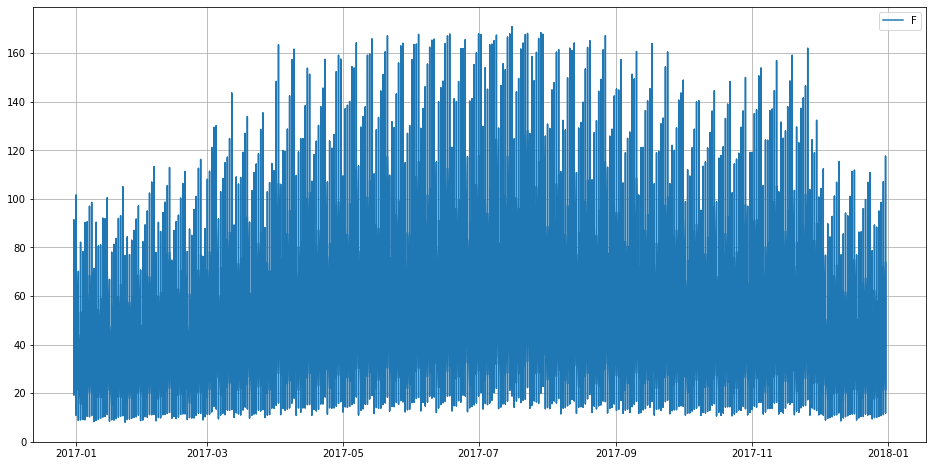

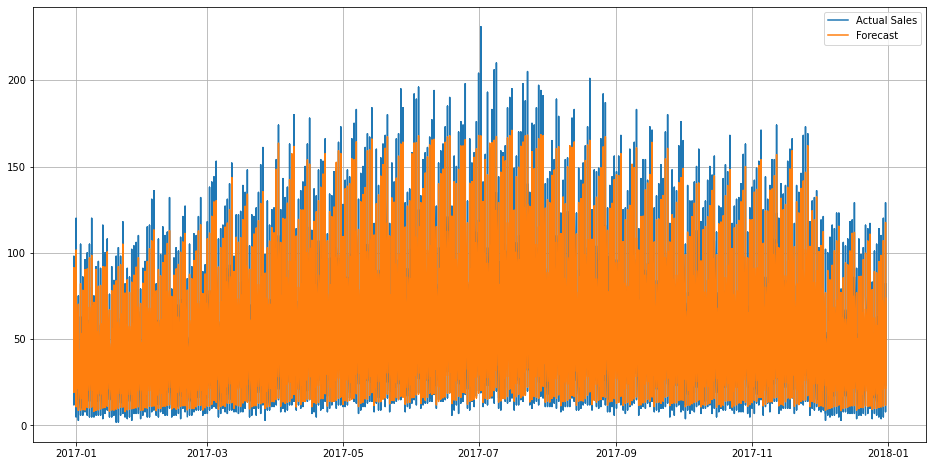

In [41]:
# Plot forecast

plot_series(time_valid, series_valid['sales'], legend='Actual Sales')
plot_series(time_valid, forecast_gru_cnn, legend='Forecast')
plot_series(time_valid, (series_valid['sales'], forecast_gru_cnn), legend=['Actual Sales', 'Forecast'])

In [42]:
# Evaluate results

mse, mae = compute_metrics(series_valid['sales'], forecast_gru_cnn)
print(f"mse: {mse:.2f}, mae: {mae:.2f} for forecast")

mse: 75.55, mae: 6.53 for forecast


The training process managed to stabilize a bit, but adding more layers to the model didn't improve the actual learning process.

## Conclusions



The choice of the method for forecasting always depends on what kind of data is available and on the predictability of the quantity to be forecast. In this case, we had a large data set with 5 years of data from 10 different stores which by forecasting with deep learning neural network provides a powerful alternative to the more classical, linear way of forecasting with ARIMA type of models.

The deep learning process happens through first sequencing the data into windows so that the network can learn the patterns of the target variable from the past, and then use this knowledge to make a prediction of the future. This means that there is no particular need to create additional features as the network creates its own features from the data set. However, in order to be able to use these machine learning techniques, the data set needs to be large enough.

When comparing the different models that were used, we could see that the gated RNNs, such as the LSTM and the GRU networks, performed the best, because they managed to extract the most useful information out of the sequences, and keep that information in memory for a longer period compared to the RNN network. Once we tried different configurations, we noticed that adding an extra convolutional layer at the beginning of the model did speed up the learning process, because the network learns the sequences through small filters which use a lot less parameters compared to the other network layers. In the end however, it seemed that keeping the model architecture as simple as possible, either with stacked LSTMs or GRUs provided the best results.